# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [60]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

image shape: {} (16, 784)


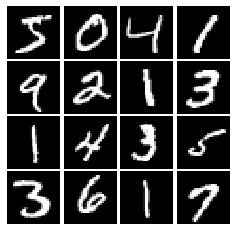

In [61]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [8]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return tf.maximum(x, alpha * x)
    

    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [9]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [10]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return tf.random.uniform([batch_size, dim], -1, 1)

    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [11]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [90]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(784, input_shape=(784,)),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [91]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator(202785)

Incorrect number of parameters in discriminator. 816657 instead of 202785. Check your achitecture.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [93]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,), activation='relu'),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.Dense(784, activation='tanh'),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [87]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [33]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss_func = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = tf.reduce_mean(loss_func(tf.ones_like(logits_real), logits_real)) + tf.reduce_mean(loss_func(tf.zeros_like(logits_fake), logits_fake))
    
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss_func = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = tf.reduce_mean(loss_func(tf.ones_like(logits_fake), logits_fake))

    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [34]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [35]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [36]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_solver = tf.optimizers.Adam(learning_rate=1e-3, beta_1=0.5)
    G_solver = tf.optimizers.Adam(learning_rate=1e-3, beta_1=0.5)

    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [88]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.279, G:0.7373
image shape: {} (16, 784)


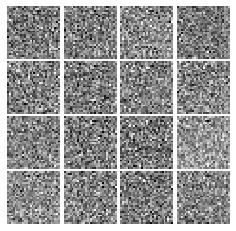

Epoch: 0, Iter: 20, D: 0.732, G:1.023
image shape: {} (16, 784)


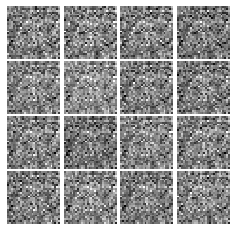

Epoch: 0, Iter: 40, D: 1.391, G:1.605
image shape: {} (16, 784)


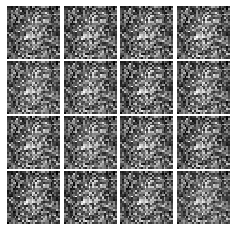

Epoch: 0, Iter: 60, D: 1.027, G:1.155
image shape: {} (16, 784)


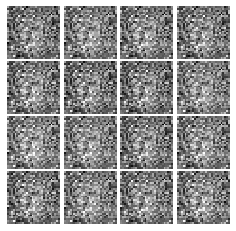

Epoch: 0, Iter: 80, D: 1.655, G:0.4759
image shape: {} (16, 784)


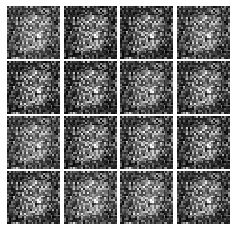

Epoch: 0, Iter: 100, D: 1.644, G:1.398
image shape: {} (16, 784)


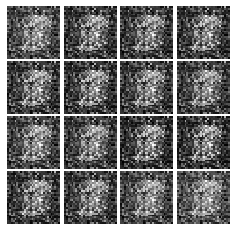

Epoch: 0, Iter: 120, D: 1.3, G:1.7
image shape: {} (16, 784)


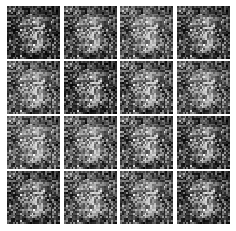

Epoch: 0, Iter: 140, D: 0.9442, G:0.949
image shape: {} (16, 784)


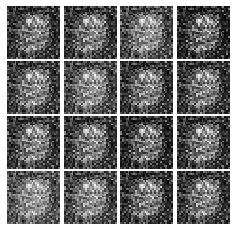

Epoch: 0, Iter: 160, D: 1.12, G:1.124
image shape: {} (16, 784)


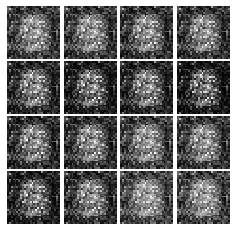

Epoch: 0, Iter: 180, D: 0.9042, G:1.094
image shape: {} (16, 784)


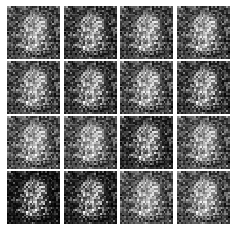

Epoch: 0, Iter: 200, D: 0.9594, G:1.414
image shape: {} (16, 784)


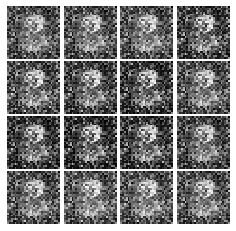

Epoch: 0, Iter: 220, D: 0.9033, G:1.088
image shape: {} (16, 784)


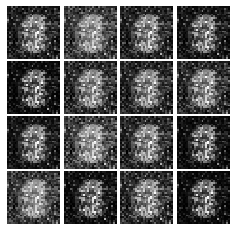

Epoch: 0, Iter: 240, D: 0.8693, G:1.789
image shape: {} (16, 784)


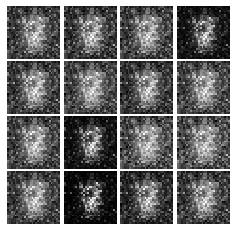

Epoch: 0, Iter: 260, D: 0.8344, G:1.559
image shape: {} (16, 784)


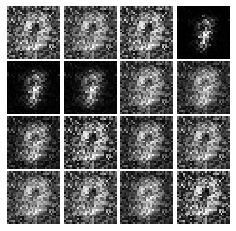

Epoch: 0, Iter: 280, D: 0.9251, G:1.853
image shape: {} (16, 784)


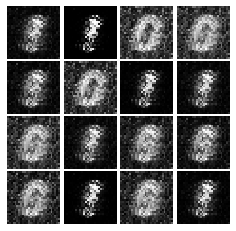

Epoch: 0, Iter: 300, D: 1.1, G:1.041
image shape: {} (16, 784)


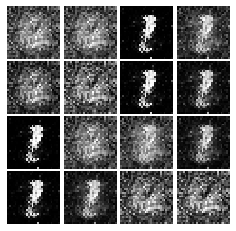

Epoch: 0, Iter: 320, D: 0.8369, G:1.477
image shape: {} (16, 784)


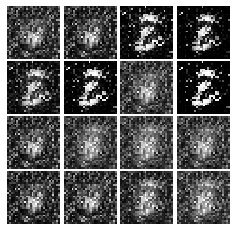

Epoch: 0, Iter: 340, D: 0.6891, G:1.286
image shape: {} (16, 784)


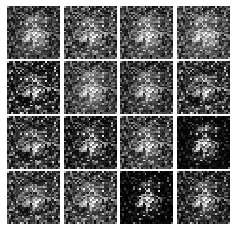

Epoch: 0, Iter: 360, D: 0.7281, G:1.969
image shape: {} (16, 784)


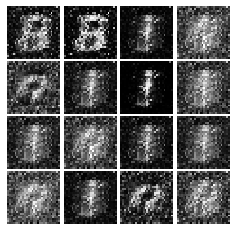

Epoch: 0, Iter: 380, D: 0.7407, G:0.5148
image shape: {} (16, 784)


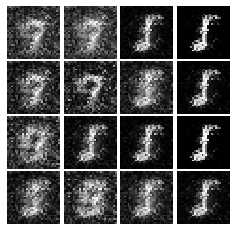

Epoch: 0, Iter: 400, D: 0.6101, G:1.878
image shape: {} (16, 784)


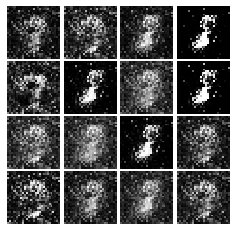

Epoch: 0, Iter: 420, D: 1.337, G:4.032
image shape: {} (16, 784)


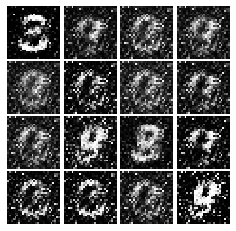

Epoch: 0, Iter: 440, D: 0.6963, G:3.315
image shape: {} (16, 784)


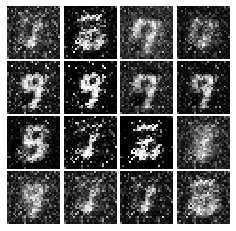

Epoch: 0, Iter: 460, D: 1.011, G:1.095
image shape: {} (16, 784)


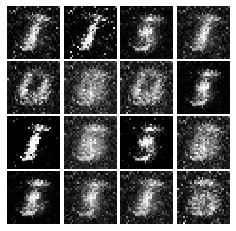

Epoch: 1, Iter: 480, D: 1.097, G:1.078
image shape: {} (16, 784)


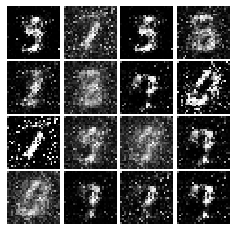

Epoch: 1, Iter: 500, D: 1.393, G:1.254
image shape: {} (16, 784)


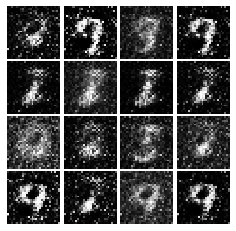

Epoch: 1, Iter: 520, D: 0.9553, G:1.226
image shape: {} (16, 784)


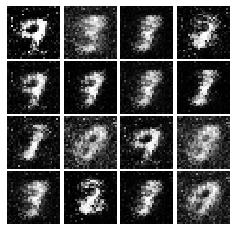

Epoch: 1, Iter: 540, D: 1.283, G:1.164
image shape: {} (16, 784)


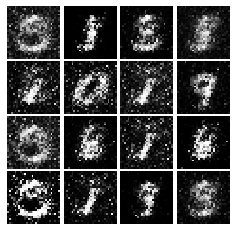

Epoch: 1, Iter: 560, D: 1.109, G:0.9763
image shape: {} (16, 784)


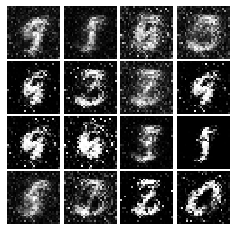

Epoch: 1, Iter: 580, D: 0.9545, G:1.028
image shape: {} (16, 784)


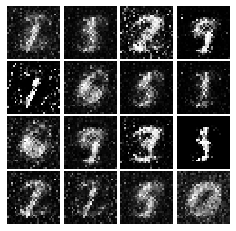

Epoch: 1, Iter: 600, D: 2.262, G:1.567
image shape: {} (16, 784)


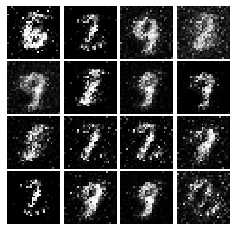

Epoch: 1, Iter: 620, D: 0.9984, G:1.529
image shape: {} (16, 784)


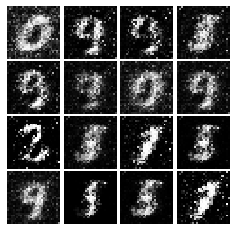

Epoch: 1, Iter: 640, D: 1.041, G:2.264
image shape: {} (16, 784)


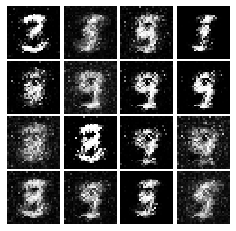

Epoch: 1, Iter: 660, D: 1.087, G:0.9972
image shape: {} (16, 784)


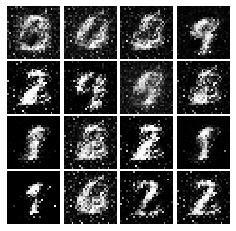

Epoch: 1, Iter: 680, D: 0.913, G:1.302
image shape: {} (16, 784)


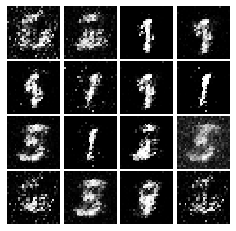

Epoch: 1, Iter: 700, D: 0.9701, G:0.9896
image shape: {} (16, 784)


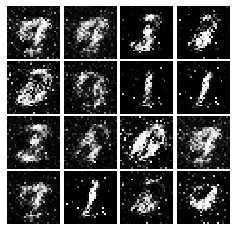

Epoch: 1, Iter: 720, D: 0.9944, G:1.477
image shape: {} (16, 784)


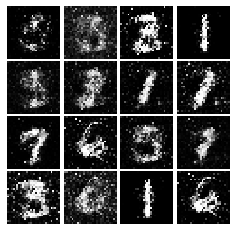

Epoch: 1, Iter: 740, D: 1.208, G:1.377
image shape: {} (16, 784)


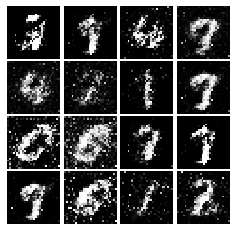

Epoch: 1, Iter: 760, D: 1.048, G:1.449
image shape: {} (16, 784)


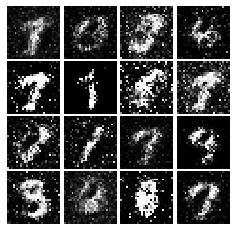

Epoch: 1, Iter: 780, D: 1.13, G:1.779
image shape: {} (16, 784)


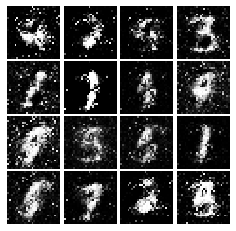

Epoch: 1, Iter: 800, D: 1.441, G:1.342
image shape: {} (16, 784)


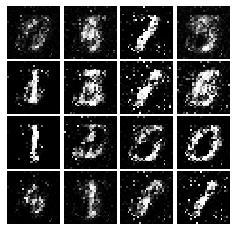

Epoch: 1, Iter: 820, D: 1.274, G:2.044
image shape: {} (16, 784)


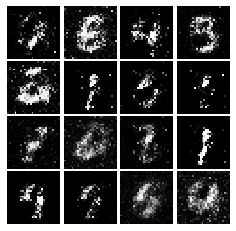

Epoch: 1, Iter: 840, D: 0.9796, G:1.039
image shape: {} (16, 784)


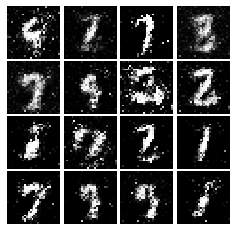

Epoch: 1, Iter: 860, D: 1.032, G:1.136
image shape: {} (16, 784)


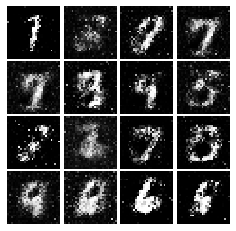

Epoch: 1, Iter: 880, D: 1.156, G:1.023
image shape: {} (16, 784)


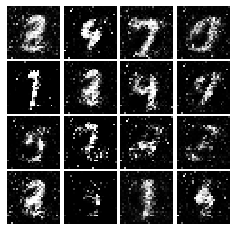

Epoch: 1, Iter: 900, D: 1.04, G:1.297
image shape: {} (16, 784)


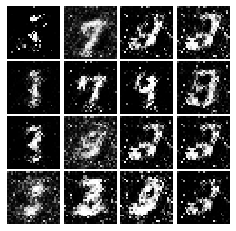

Epoch: 1, Iter: 920, D: 1.254, G:1.068
image shape: {} (16, 784)


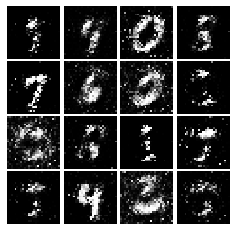

Epoch: 2, Iter: 940, D: 0.9145, G:1.808
image shape: {} (16, 784)


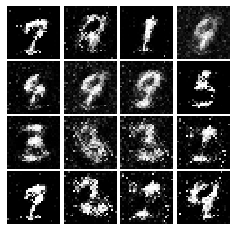

Epoch: 2, Iter: 960, D: 1.073, G:1.25
image shape: {} (16, 784)


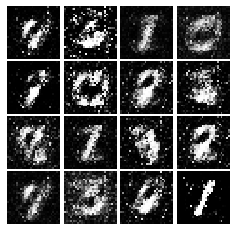

Epoch: 2, Iter: 980, D: 0.8661, G:1.353
image shape: {} (16, 784)


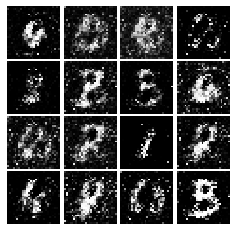

Epoch: 2, Iter: 1000, D: 1.261, G:0.985
image shape: {} (16, 784)


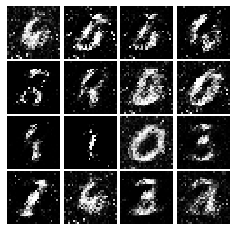

Epoch: 2, Iter: 1020, D: 1.189, G:0.8776
image shape: {} (16, 784)


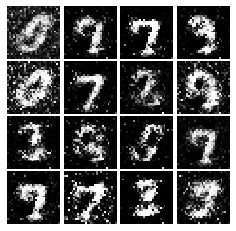

Epoch: 2, Iter: 1040, D: 0.9857, G:1.064
image shape: {} (16, 784)


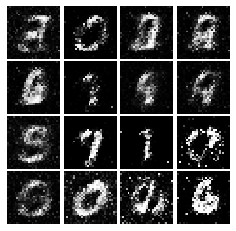

Epoch: 2, Iter: 1060, D: 1.153, G:1.196
image shape: {} (16, 784)


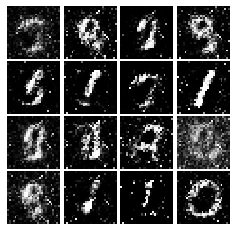

Epoch: 2, Iter: 1080, D: 1.489, G:0.2893
image shape: {} (16, 784)


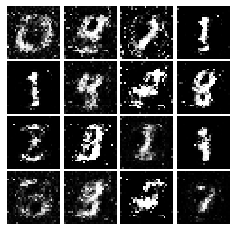

Epoch: 2, Iter: 1100, D: 1.184, G:0.4785
image shape: {} (16, 784)


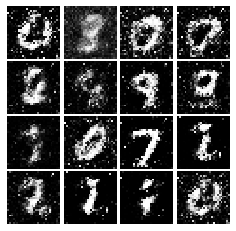

Epoch: 2, Iter: 1120, D: 1.309, G:1.225
image shape: {} (16, 784)


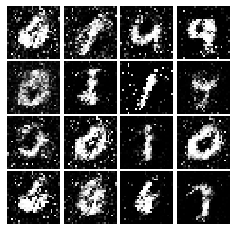

Epoch: 2, Iter: 1140, D: 1.101, G:1.027
image shape: {} (16, 784)


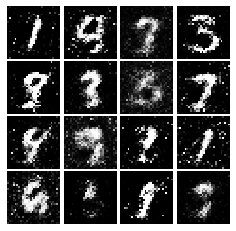

Epoch: 2, Iter: 1160, D: 1.118, G:0.9731
image shape: {} (16, 784)


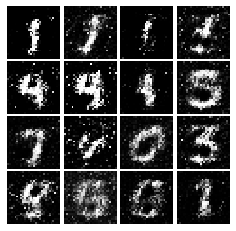

Epoch: 2, Iter: 1180, D: 1.123, G:0.9845
image shape: {} (16, 784)


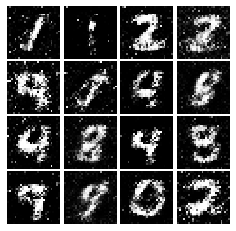

Epoch: 2, Iter: 1200, D: 1.146, G:1.727
image shape: {} (16, 784)


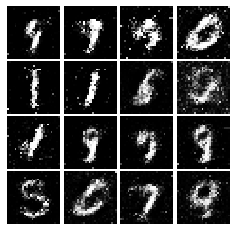

Epoch: 2, Iter: 1220, D: 1.032, G:1.183
image shape: {} (16, 784)


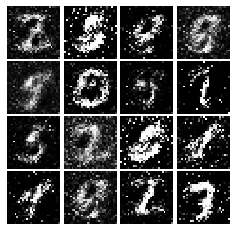

Epoch: 2, Iter: 1240, D: 1.05, G:1.193
image shape: {} (16, 784)


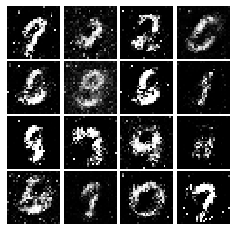

Epoch: 2, Iter: 1260, D: 1.283, G:0.9248
image shape: {} (16, 784)


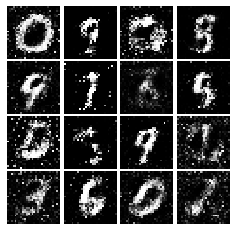

Epoch: 2, Iter: 1280, D: 1.149, G:1.244
image shape: {} (16, 784)


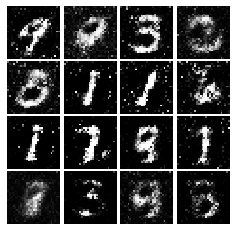

Epoch: 2, Iter: 1300, D: 1.08, G:1.046
image shape: {} (16, 784)


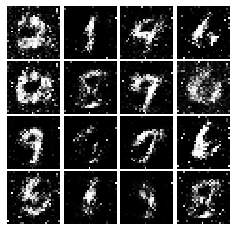

Epoch: 2, Iter: 1320, D: 1.322, G:0.913
image shape: {} (16, 784)


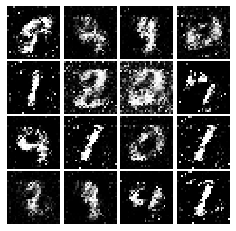

Epoch: 2, Iter: 1340, D: 1.184, G:0.8996
image shape: {} (16, 784)


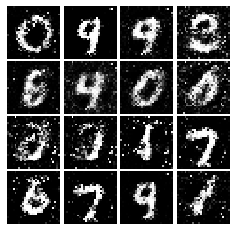

Epoch: 2, Iter: 1360, D: 1.221, G:0.9688
image shape: {} (16, 784)


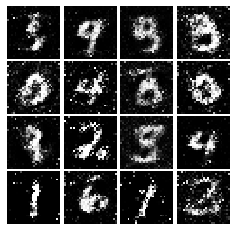

Epoch: 2, Iter: 1380, D: 1.158, G:1.139
image shape: {} (16, 784)


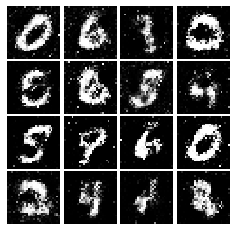

Epoch: 2, Iter: 1400, D: 1.04, G:1.048
image shape: {} (16, 784)


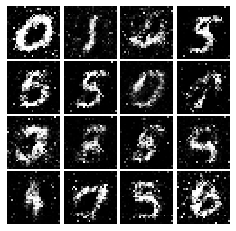

Epoch: 3, Iter: 1420, D: 1.168, G:0.9681
image shape: {} (16, 784)


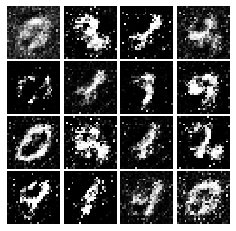

Epoch: 3, Iter: 1440, D: 1.253, G:0.9617
image shape: {} (16, 784)


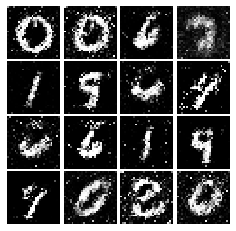

Epoch: 3, Iter: 1460, D: 1.24, G:0.8505
image shape: {} (16, 784)


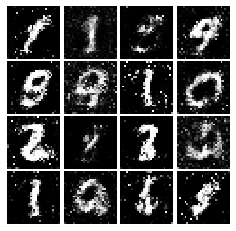

Epoch: 3, Iter: 1480, D: 1.226, G:0.9738
image shape: {} (16, 784)


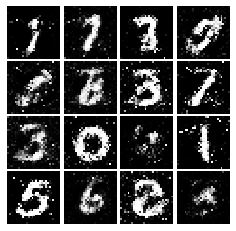

Epoch: 3, Iter: 1500, D: 1.227, G:1.08
image shape: {} (16, 784)


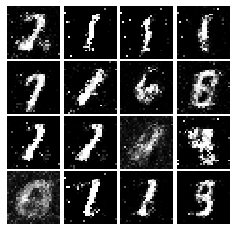

Epoch: 3, Iter: 1520, D: 1.172, G:0.8846
image shape: {} (16, 784)


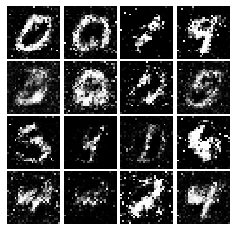

Epoch: 3, Iter: 1540, D: 1.2, G:0.8914
image shape: {} (16, 784)


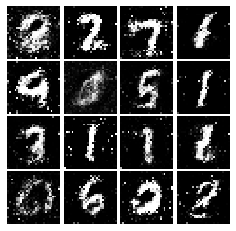

Epoch: 3, Iter: 1560, D: 1.152, G:0.9195
image shape: {} (16, 784)


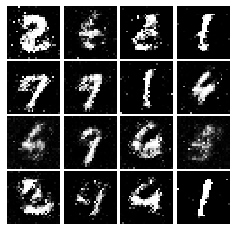

Epoch: 3, Iter: 1580, D: 1.426, G:1.196
image shape: {} (16, 784)


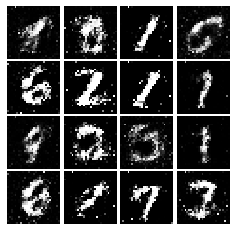

Epoch: 3, Iter: 1600, D: 1.194, G:0.8958
image shape: {} (16, 784)


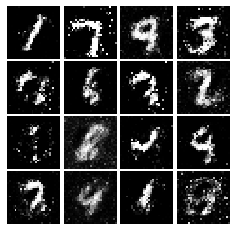

Epoch: 3, Iter: 1620, D: 1.16, G:0.9713
image shape: {} (16, 784)


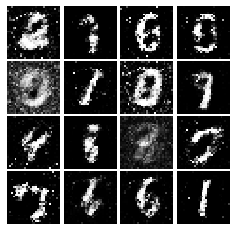

Epoch: 3, Iter: 1640, D: 1.384, G:0.9109
image shape: {} (16, 784)


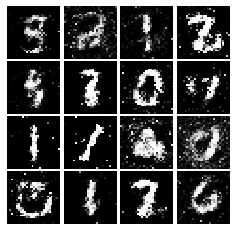

Epoch: 3, Iter: 1660, D: 1.139, G:0.9127
image shape: {} (16, 784)


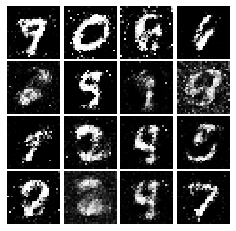

Epoch: 3, Iter: 1680, D: 1.16, G:0.9914
image shape: {} (16, 784)


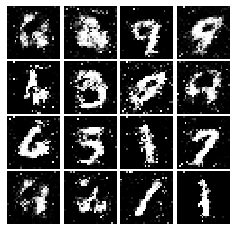

Epoch: 3, Iter: 1700, D: 1.315, G:0.9247
image shape: {} (16, 784)


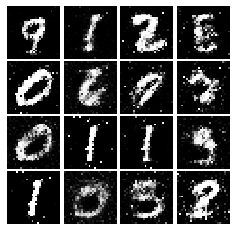

Epoch: 3, Iter: 1720, D: 1.357, G:0.845
image shape: {} (16, 784)


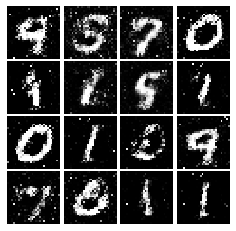

Epoch: 3, Iter: 1740, D: 1.185, G:1.023
image shape: {} (16, 784)


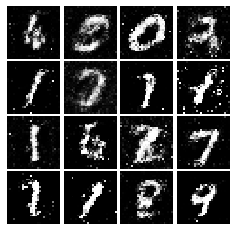

Epoch: 3, Iter: 1760, D: 1.161, G:0.905
image shape: {} (16, 784)


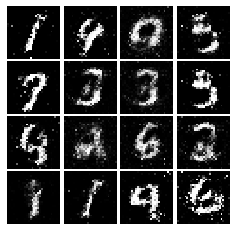

Epoch: 3, Iter: 1780, D: 1.293, G:0.9211
image shape: {} (16, 784)


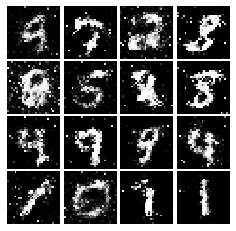

Epoch: 3, Iter: 1800, D: 1.306, G:0.6532
image shape: {} (16, 784)


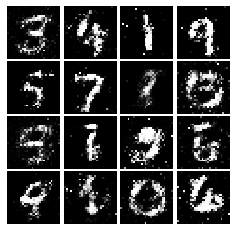

Epoch: 3, Iter: 1820, D: 1.243, G:1.419
image shape: {} (16, 784)


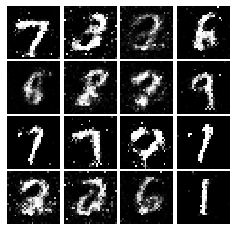

Epoch: 3, Iter: 1840, D: 1.186, G:0.936
image shape: {} (16, 784)


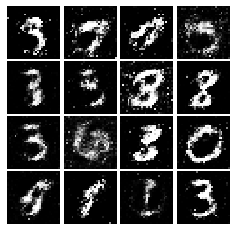

Epoch: 3, Iter: 1860, D: 1.108, G:1.183
image shape: {} (16, 784)


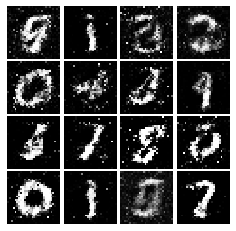

Epoch: 4, Iter: 1880, D: 1.211, G:0.9283
image shape: {} (16, 784)


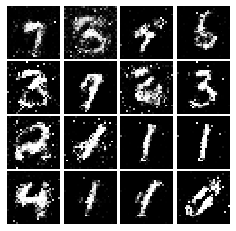

Epoch: 4, Iter: 1900, D: 1.217, G:0.975
image shape: {} (16, 784)


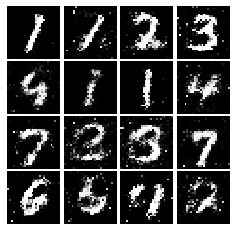

Epoch: 4, Iter: 1920, D: 1.452, G:0.5161
image shape: {} (16, 784)


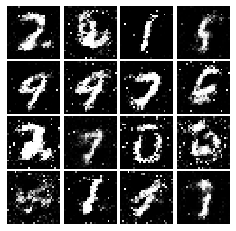

Epoch: 4, Iter: 1940, D: 1.205, G:1.209
image shape: {} (16, 784)


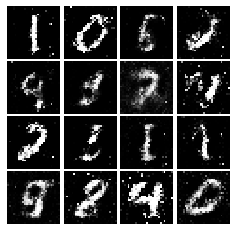

Epoch: 4, Iter: 1960, D: 1.124, G:1.396
image shape: {} (16, 784)


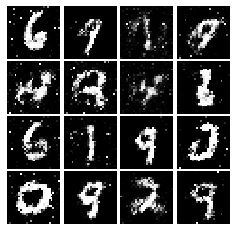

Epoch: 4, Iter: 1980, D: 1.217, G:0.9035
image shape: {} (16, 784)


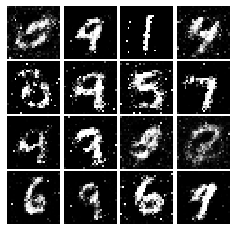

Epoch: 4, Iter: 2000, D: 1.32, G:0.9386
image shape: {} (16, 784)


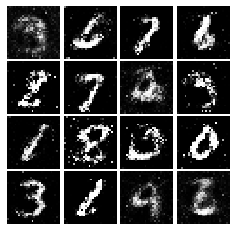

Epoch: 4, Iter: 2020, D: 1.232, G:1.022
image shape: {} (16, 784)


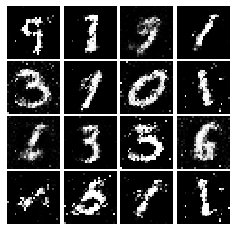

Epoch: 4, Iter: 2040, D: 1.225, G:1.035
image shape: {} (16, 784)


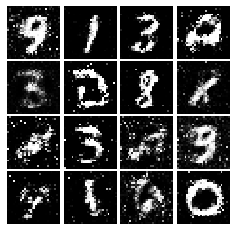

Epoch: 4, Iter: 2060, D: 1.286, G:1.093
image shape: {} (16, 784)


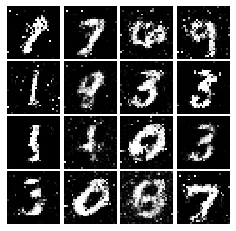

Epoch: 4, Iter: 2080, D: 1.242, G:1.13
image shape: {} (16, 784)


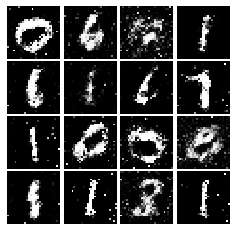

Epoch: 4, Iter: 2100, D: 1.694, G:2.495
image shape: {} (16, 784)


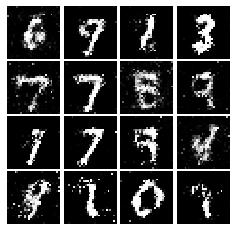

Epoch: 4, Iter: 2120, D: 1.227, G:0.9373
image shape: {} (16, 784)


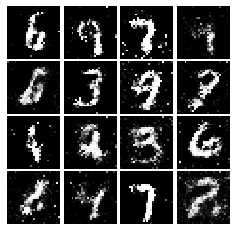

Epoch: 4, Iter: 2140, D: 1.154, G:0.9908
image shape: {} (16, 784)


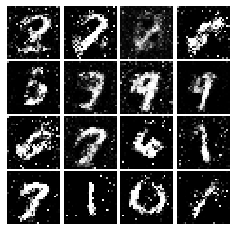

Epoch: 4, Iter: 2160, D: 1.369, G:0.8658
image shape: {} (16, 784)


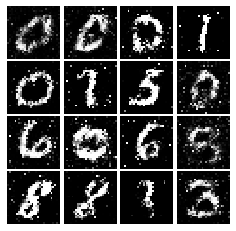

Epoch: 4, Iter: 2180, D: 1.229, G:0.9087
image shape: {} (16, 784)


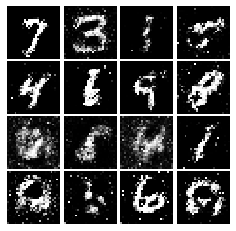

Epoch: 4, Iter: 2200, D: 1.204, G:1.016
image shape: {} (16, 784)


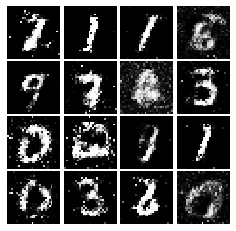

Epoch: 4, Iter: 2220, D: 1.214, G:0.8961
image shape: {} (16, 784)


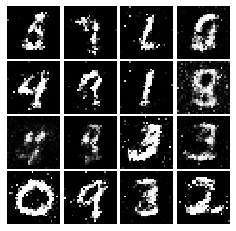

Epoch: 4, Iter: 2240, D: 1.194, G:1.276
image shape: {} (16, 784)


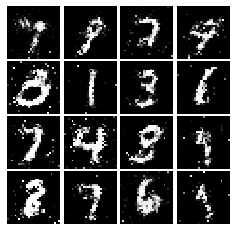

Epoch: 4, Iter: 2260, D: 1.478, G:0.4794
image shape: {} (16, 784)


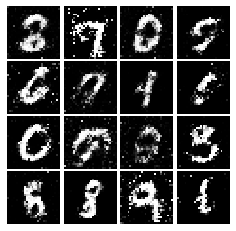

Epoch: 4, Iter: 2280, D: 1.248, G:0.952
image shape: {} (16, 784)


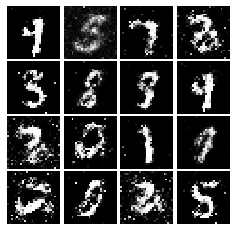

Epoch: 4, Iter: 2300, D: 1.193, G:0.7688
image shape: {} (16, 784)


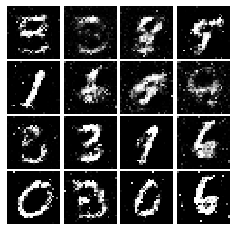

Epoch: 4, Iter: 2320, D: 1.32, G:1.052
image shape: {} (16, 784)


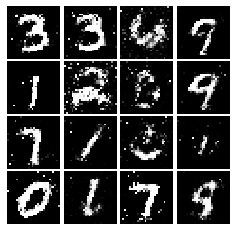

Epoch: 4, Iter: 2340, D: 1.09, G:0.9226
image shape: {} (16, 784)


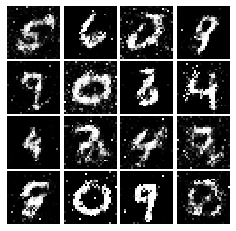

Epoch: 5, Iter: 2360, D: 1.213, G:1.009
image shape: {} (16, 784)


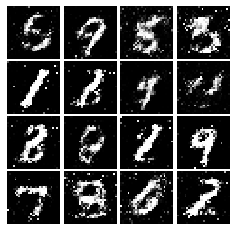

Epoch: 5, Iter: 2380, D: 1.228, G:0.9424
image shape: {} (16, 784)


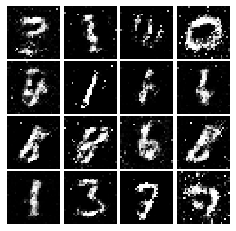

Epoch: 5, Iter: 2400, D: 1.327, G:0.949
image shape: {} (16, 784)


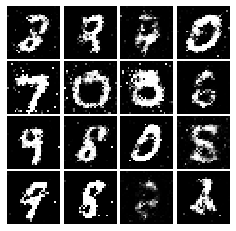

Epoch: 5, Iter: 2420, D: 1.239, G:0.968
image shape: {} (16, 784)


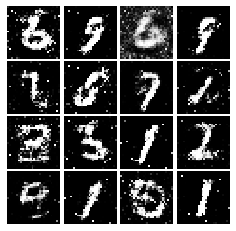

Epoch: 5, Iter: 2440, D: 1.231, G:0.9517
image shape: {} (16, 784)


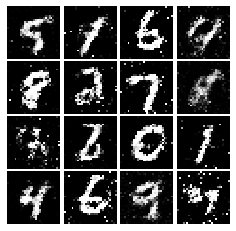

Epoch: 5, Iter: 2460, D: 1.054, G:0.9837
image shape: {} (16, 784)


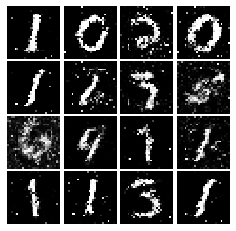

Epoch: 5, Iter: 2480, D: 1.272, G:0.8908
image shape: {} (16, 784)


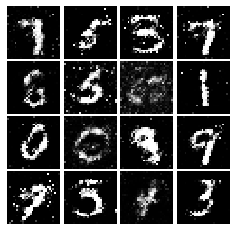

Epoch: 5, Iter: 2500, D: 1.285, G:0.8353
image shape: {} (16, 784)


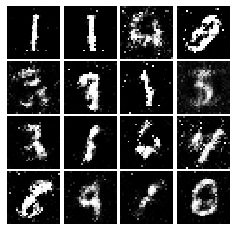

Epoch: 5, Iter: 2520, D: 1.551, G:0.9536
image shape: {} (16, 784)


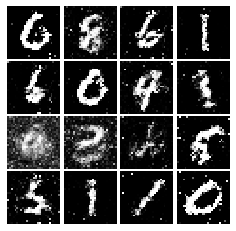

Epoch: 5, Iter: 2540, D: 1.251, G:0.8558
image shape: {} (16, 784)


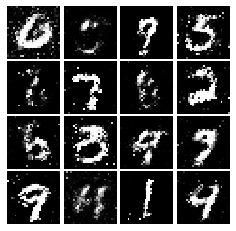

Epoch: 5, Iter: 2560, D: 1.358, G:0.8563
image shape: {} (16, 784)


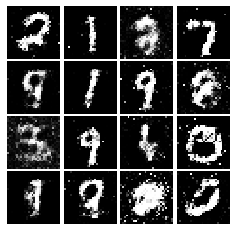

Epoch: 5, Iter: 2580, D: 1.358, G:1.188
image shape: {} (16, 784)


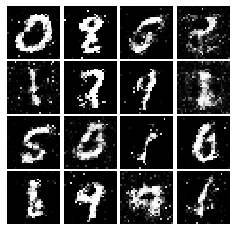

Epoch: 5, Iter: 2600, D: 1.382, G:0.7937
image shape: {} (16, 784)


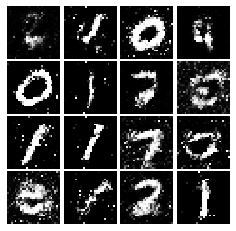

Epoch: 5, Iter: 2620, D: 1.237, G:0.8961
image shape: {} (16, 784)


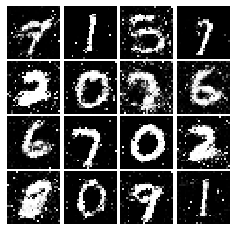

Epoch: 5, Iter: 2640, D: 1.325, G:0.9787
image shape: {} (16, 784)


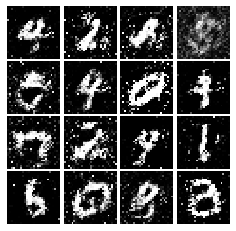

Epoch: 5, Iter: 2660, D: 1.266, G:0.8318
image shape: {} (16, 784)


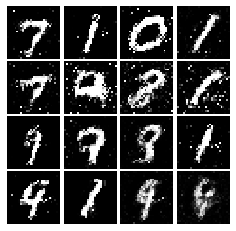

Epoch: 5, Iter: 2680, D: 1.499, G:0.8431
image shape: {} (16, 784)


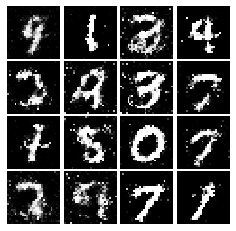

Epoch: 5, Iter: 2700, D: 1.301, G:0.82
image shape: {} (16, 784)


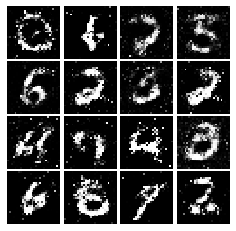

Epoch: 5, Iter: 2720, D: 1.245, G:0.7413
image shape: {} (16, 784)


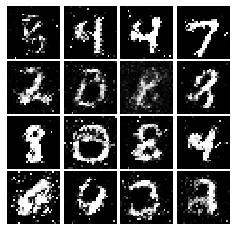

Epoch: 5, Iter: 2740, D: 1.263, G:0.7785
image shape: {} (16, 784)


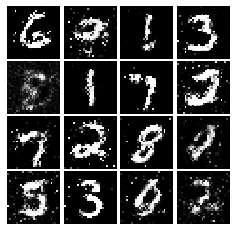

Epoch: 5, Iter: 2760, D: 1.304, G:0.9719
image shape: {} (16, 784)


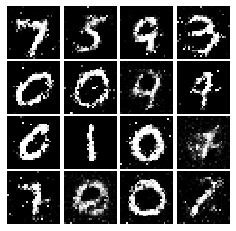

Epoch: 5, Iter: 2780, D: 1.233, G:0.7492
image shape: {} (16, 784)


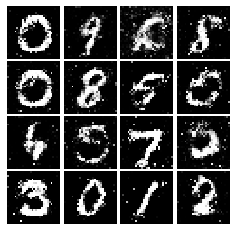

Epoch: 5, Iter: 2800, D: 1.23, G:1.07
image shape: {} (16, 784)


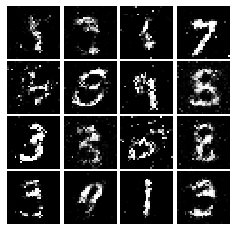

Epoch: 6, Iter: 2820, D: 1.31, G:0.8147
image shape: {} (16, 784)


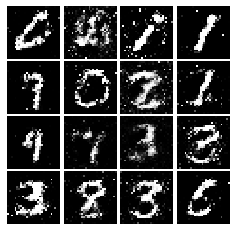

Epoch: 6, Iter: 2840, D: 1.263, G:1.048
image shape: {} (16, 784)


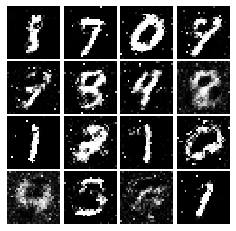

Epoch: 6, Iter: 2860, D: 1.255, G:0.9321
image shape: {} (16, 784)


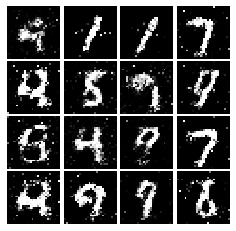

Epoch: 6, Iter: 2880, D: 1.02, G:1.136
image shape: {} (16, 784)


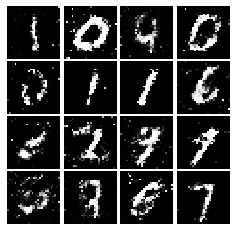

Epoch: 6, Iter: 2900, D: 1.311, G:0.8559
image shape: {} (16, 784)


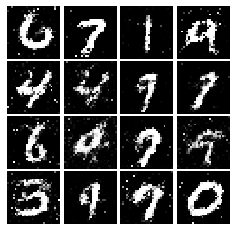

Epoch: 6, Iter: 2920, D: 1.38, G:0.8787
image shape: {} (16, 784)


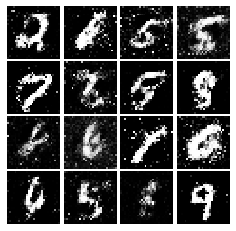

Epoch: 6, Iter: 2940, D: 1.264, G:0.8138
image shape: {} (16, 784)


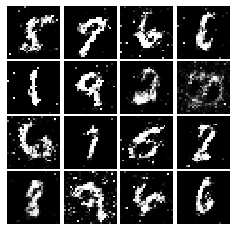

Epoch: 6, Iter: 2960, D: 1.254, G:0.9363
image shape: {} (16, 784)


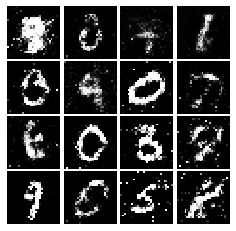

Epoch: 6, Iter: 2980, D: 1.298, G:0.9149
image shape: {} (16, 784)


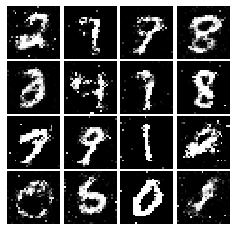

Epoch: 6, Iter: 3000, D: 1.255, G:0.9215
image shape: {} (16, 784)


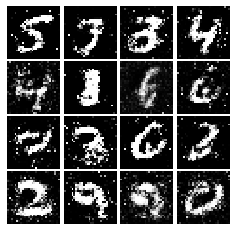

Epoch: 6, Iter: 3020, D: 1.267, G:0.7879
image shape: {} (16, 784)


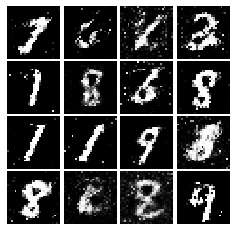

Epoch: 6, Iter: 3040, D: 1.298, G:0.6818
image shape: {} (16, 784)


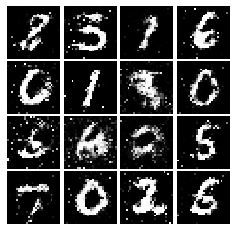

Epoch: 6, Iter: 3060, D: 1.32, G:0.7268
image shape: {} (16, 784)


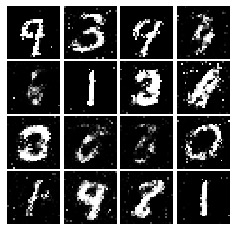

Epoch: 6, Iter: 3080, D: 1.354, G:0.9659
image shape: {} (16, 784)


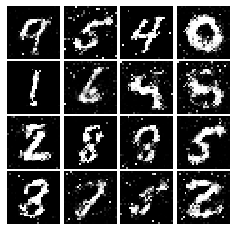

Epoch: 6, Iter: 3100, D: 1.221, G:0.9335
image shape: {} (16, 784)


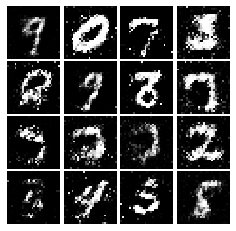

Epoch: 6, Iter: 3120, D: 1.31, G:1.09
image shape: {} (16, 784)


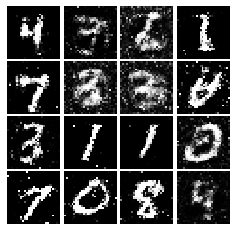

Epoch: 6, Iter: 3140, D: 1.39, G:1.094
image shape: {} (16, 784)


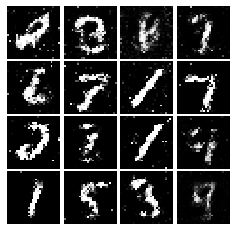

Epoch: 6, Iter: 3160, D: 1.3, G:0.903
image shape: {} (16, 784)


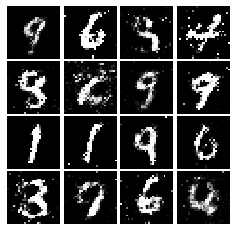

Epoch: 6, Iter: 3180, D: 1.266, G:0.8011
image shape: {} (16, 784)


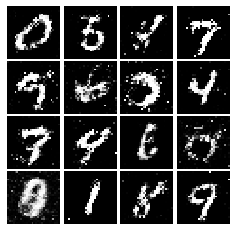

Epoch: 6, Iter: 3200, D: 1.314, G:0.9567
image shape: {} (16, 784)


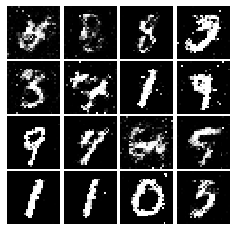

Epoch: 6, Iter: 3220, D: 1.271, G:0.6935
image shape: {} (16, 784)


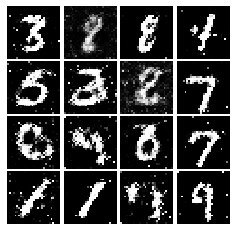

Epoch: 6, Iter: 3240, D: 1.229, G:0.7575
image shape: {} (16, 784)


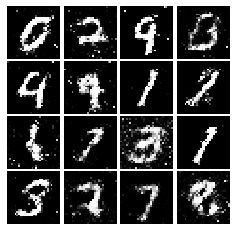

Epoch: 6, Iter: 3260, D: 1.328, G:0.7652
image shape: {} (16, 784)


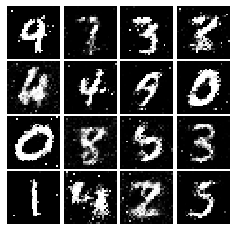

Epoch: 6, Iter: 3280, D: 1.318, G:0.8022
image shape: {} (16, 784)


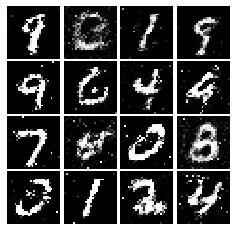

Epoch: 7, Iter: 3300, D: 1.323, G:1.056
image shape: {} (16, 784)


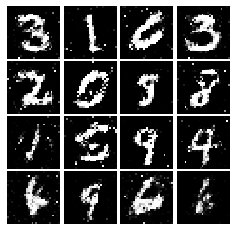

Epoch: 7, Iter: 3320, D: 1.219, G:0.7668
image shape: {} (16, 784)


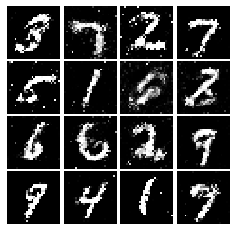

Epoch: 7, Iter: 3340, D: 1.297, G:0.8515
image shape: {} (16, 784)


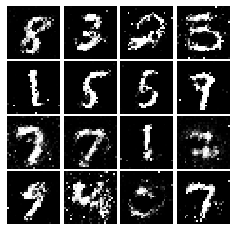

Epoch: 7, Iter: 3360, D: 1.271, G:0.8795
image shape: {} (16, 784)


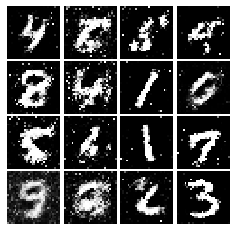

Epoch: 7, Iter: 3380, D: 1.31, G:0.7874
image shape: {} (16, 784)


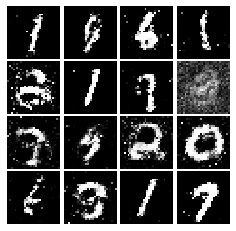

Epoch: 7, Iter: 3400, D: 1.318, G:0.9198
image shape: {} (16, 784)


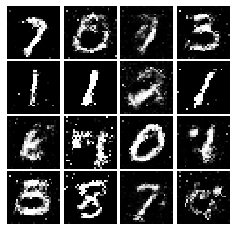

Epoch: 7, Iter: 3420, D: 1.248, G:0.8664
image shape: {} (16, 784)


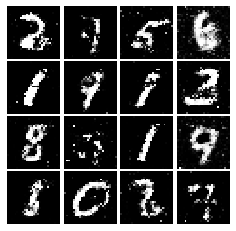

Epoch: 7, Iter: 3440, D: 1.275, G:0.9168
image shape: {} (16, 784)


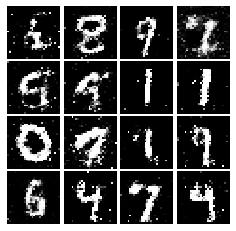

Epoch: 7, Iter: 3460, D: 1.322, G:0.7948
image shape: {} (16, 784)


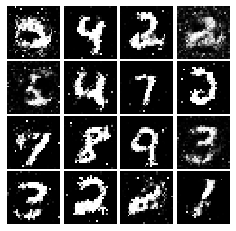

Epoch: 7, Iter: 3480, D: 1.278, G:0.7386
image shape: {} (16, 784)


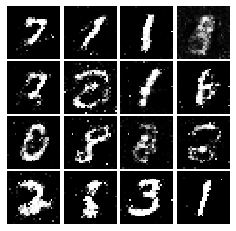

Epoch: 7, Iter: 3500, D: 1.273, G:0.8285
image shape: {} (16, 784)


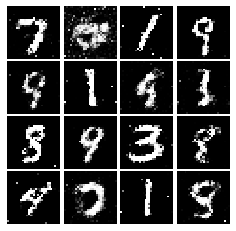

Epoch: 7, Iter: 3520, D: 1.293, G:0.702
image shape: {} (16, 784)


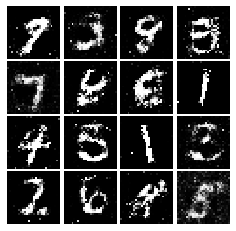

Epoch: 7, Iter: 3540, D: 1.239, G:0.8225
image shape: {} (16, 784)


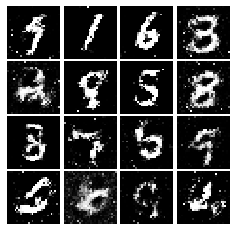

Epoch: 7, Iter: 3560, D: 1.237, G:1.079
image shape: {} (16, 784)


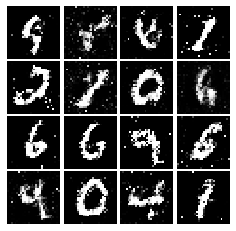

Epoch: 7, Iter: 3580, D: 1.293, G:0.7969
image shape: {} (16, 784)


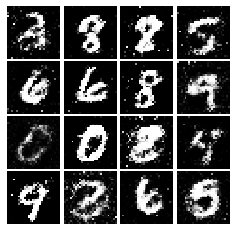

Epoch: 7, Iter: 3600, D: 1.292, G:0.8622
image shape: {} (16, 784)


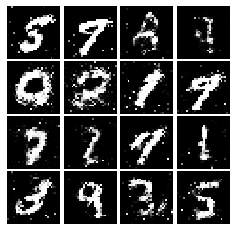

Epoch: 7, Iter: 3620, D: 1.394, G:1.038
image shape: {} (16, 784)


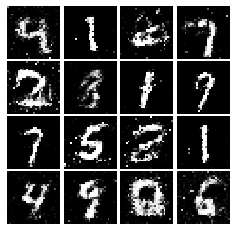

Epoch: 7, Iter: 3640, D: 1.332, G:0.8219
image shape: {} (16, 784)


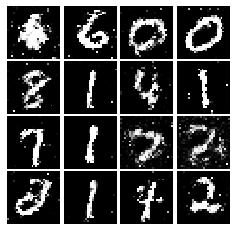

Epoch: 7, Iter: 3660, D: 1.225, G:0.8101
image shape: {} (16, 784)


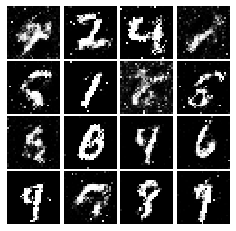

Epoch: 7, Iter: 3680, D: 1.305, G:1.245
image shape: {} (16, 784)


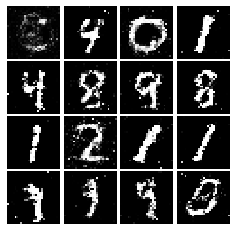

Epoch: 7, Iter: 3700, D: 1.31, G:0.7849
image shape: {} (16, 784)


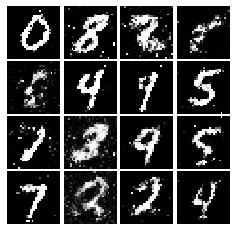

Epoch: 7, Iter: 3720, D: 1.298, G:0.5904
image shape: {} (16, 784)


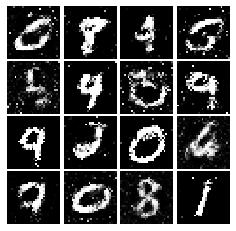

Epoch: 7, Iter: 3740, D: 1.366, G:0.758
image shape: {} (16, 784)


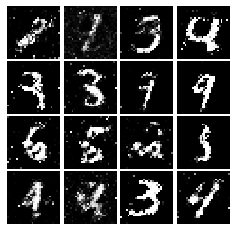

Epoch: 8, Iter: 3760, D: 1.322, G:1.049
image shape: {} (16, 784)


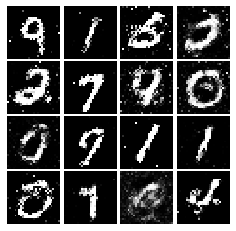

Epoch: 8, Iter: 3780, D: 1.4, G:0.9346
image shape: {} (16, 784)


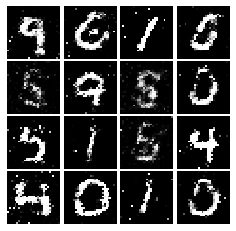

Epoch: 8, Iter: 3800, D: 1.281, G:0.7597
image shape: {} (16, 784)


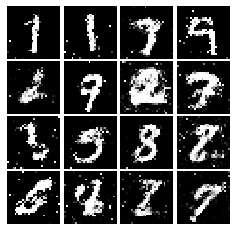

Epoch: 8, Iter: 3820, D: 1.371, G:0.737
image shape: {} (16, 784)


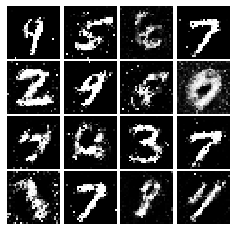

Epoch: 8, Iter: 3840, D: 1.347, G:0.8442
image shape: {} (16, 784)


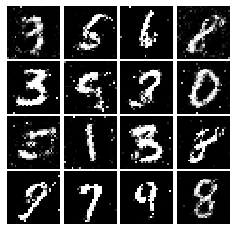

Epoch: 8, Iter: 3860, D: 1.3, G:0.8486
image shape: {} (16, 784)


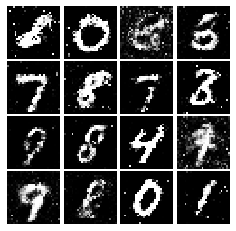

Epoch: 8, Iter: 3880, D: 1.227, G:0.9414
image shape: {} (16, 784)


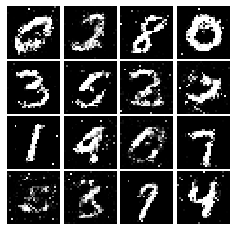

Epoch: 8, Iter: 3900, D: 1.314, G:0.8154
image shape: {} (16, 784)


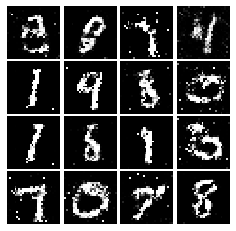

Epoch: 8, Iter: 3920, D: 1.274, G:0.7835
image shape: {} (16, 784)


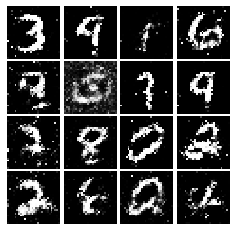

Epoch: 8, Iter: 3940, D: 1.37, G:0.8941
image shape: {} (16, 784)


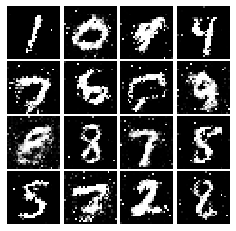

Epoch: 8, Iter: 3960, D: 1.429, G:0.829
image shape: {} (16, 784)


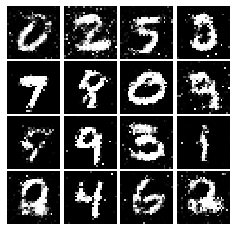

Epoch: 8, Iter: 3980, D: 1.297, G:0.856
image shape: {} (16, 784)


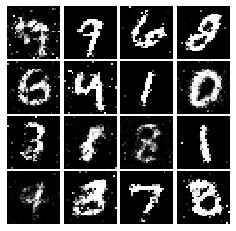

Epoch: 8, Iter: 4000, D: 1.317, G:0.8203
image shape: {} (16, 784)


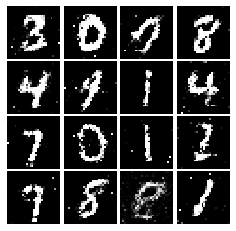

Epoch: 8, Iter: 4020, D: 1.364, G:0.7963
image shape: {} (16, 784)


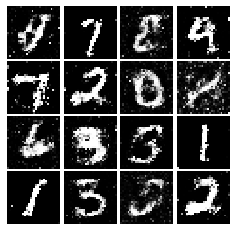

Epoch: 8, Iter: 4040, D: 1.304, G:0.7511
image shape: {} (16, 784)


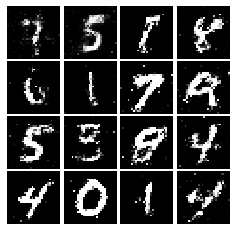

Epoch: 8, Iter: 4060, D: 1.298, G:0.8903
image shape: {} (16, 784)


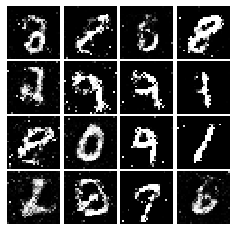

Epoch: 8, Iter: 4080, D: 1.389, G:0.8723
image shape: {} (16, 784)


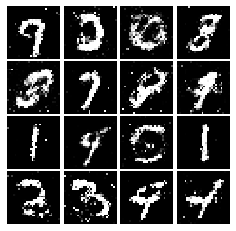

Epoch: 8, Iter: 4100, D: 1.339, G:0.9619
image shape: {} (16, 784)


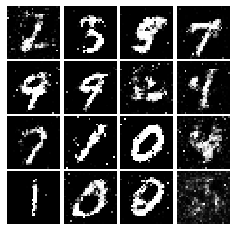

Epoch: 8, Iter: 4120, D: 1.298, G:0.9354
image shape: {} (16, 784)


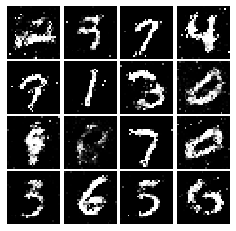

Epoch: 8, Iter: 4140, D: 1.323, G:0.8028
image shape: {} (16, 784)


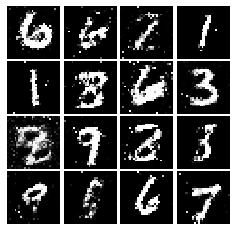

Epoch: 8, Iter: 4160, D: 1.354, G:0.4256
image shape: {} (16, 784)


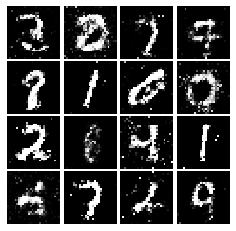

Epoch: 8, Iter: 4180, D: 1.343, G:0.9573
image shape: {} (16, 784)


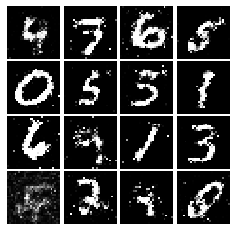

Epoch: 8, Iter: 4200, D: 1.3, G:0.832
image shape: {} (16, 784)


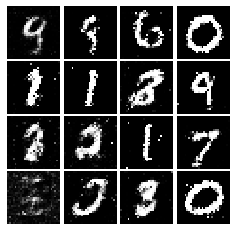

Epoch: 8, Iter: 4220, D: 1.306, G:0.8193
image shape: {} (16, 784)


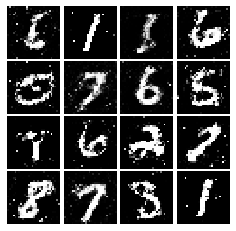

Epoch: 9, Iter: 4240, D: 1.282, G:0.7881
image shape: {} (16, 784)


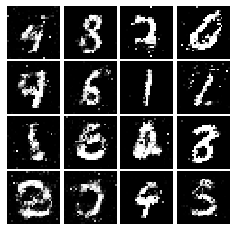

Epoch: 9, Iter: 4260, D: 1.319, G:0.8326
image shape: {} (16, 784)


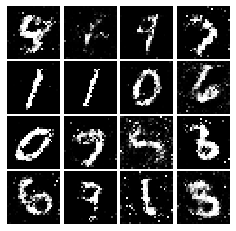

Epoch: 9, Iter: 4280, D: 1.392, G:0.9766
image shape: {} (16, 784)


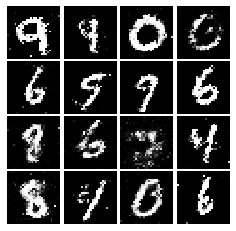

Epoch: 9, Iter: 4300, D: 1.301, G:0.7786
image shape: {} (16, 784)


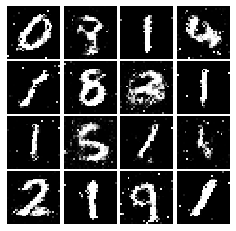

Epoch: 9, Iter: 4320, D: 1.268, G:0.8551
image shape: {} (16, 784)


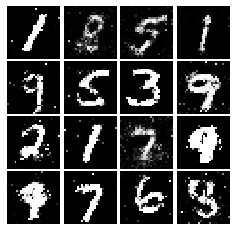

Epoch: 9, Iter: 4340, D: 1.291, G:0.7418
image shape: {} (16, 784)


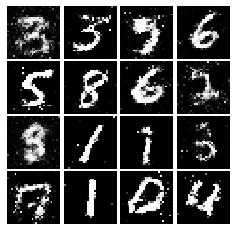

Epoch: 9, Iter: 4360, D: 1.363, G:0.7927
image shape: {} (16, 784)


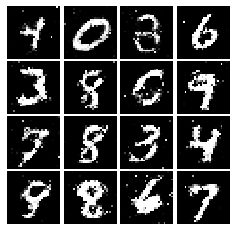

Epoch: 9, Iter: 4380, D: 1.419, G:0.816
image shape: {} (16, 784)


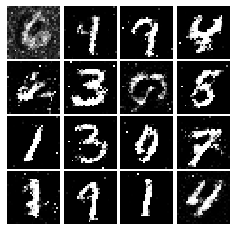

Epoch: 9, Iter: 4400, D: 1.289, G:0.8181
image shape: {} (16, 784)


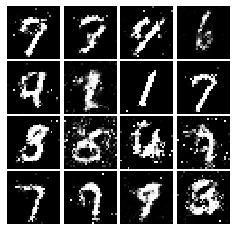

Epoch: 9, Iter: 4420, D: 1.379, G:0.9441
image shape: {} (16, 784)


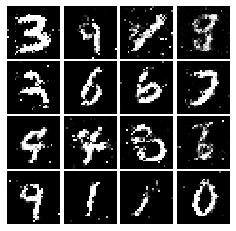

Epoch: 9, Iter: 4440, D: 1.365, G:0.7094
image shape: {} (16, 784)


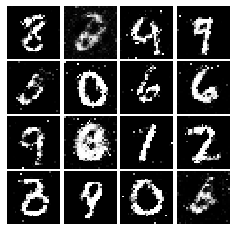

Epoch: 9, Iter: 4460, D: 1.407, G:0.7555
image shape: {} (16, 784)


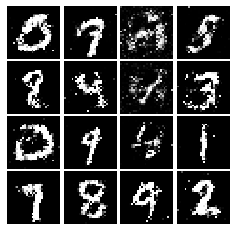

Epoch: 9, Iter: 4480, D: 1.24, G:0.9066
image shape: {} (16, 784)


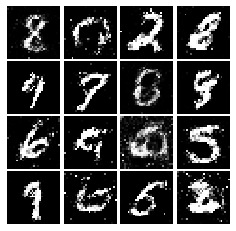

Epoch: 9, Iter: 4500, D: 1.347, G:0.7808
image shape: {} (16, 784)


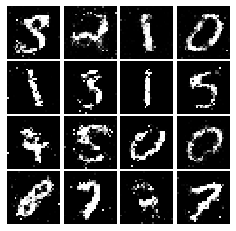

Epoch: 9, Iter: 4520, D: 1.31, G:0.8277
image shape: {} (16, 784)


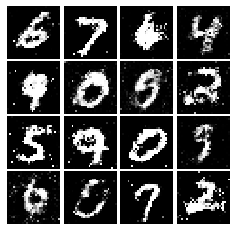

Epoch: 9, Iter: 4540, D: 1.296, G:0.7916
image shape: {} (16, 784)


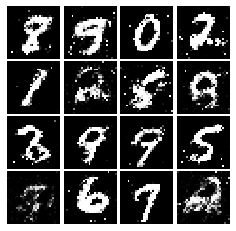

Epoch: 9, Iter: 4560, D: 1.392, G:0.6885
image shape: {} (16, 784)


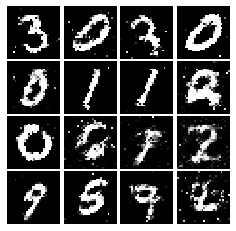

Epoch: 9, Iter: 4580, D: 1.347, G:1.17
image shape: {} (16, 784)


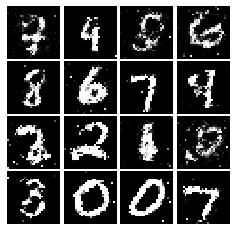

Epoch: 9, Iter: 4600, D: 1.356, G:0.8788
image shape: {} (16, 784)


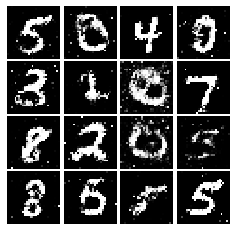

Epoch: 9, Iter: 4620, D: 1.327, G:0.759
image shape: {} (16, 784)


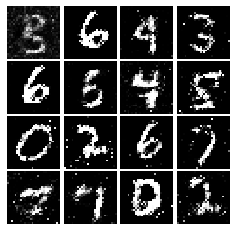

Epoch: 9, Iter: 4640, D: 1.284, G:0.7607
image shape: {} (16, 784)


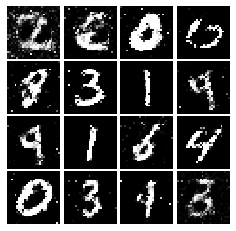

Epoch: 9, Iter: 4660, D: 1.429, G:0.8732
image shape: {} (16, 784)


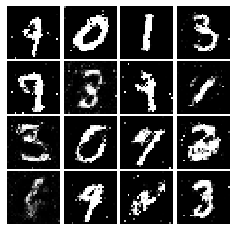

Epoch: 9, Iter: 4680, D: 1.321, G:0.7575
image shape: {} (16, 784)


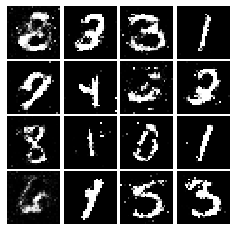

Final images
image shape: {} (16, 784)


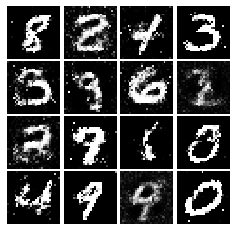

In [92]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [94]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5 * tf.reduce_mean((scores_real-1)**2) + 0.5 * tf.reduce_mean(scores_fake**2)

    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5 * tf.reduce_mean((scores_fake-1)**2)

    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [95]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.1779, G:0.2722
image shape: {} (16, 784)


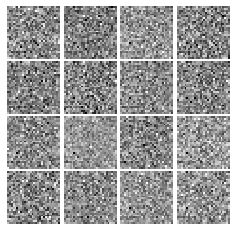

Epoch: 0, Iter: 20, D: 0.09102, G:1.502
image shape: {} (16, 784)


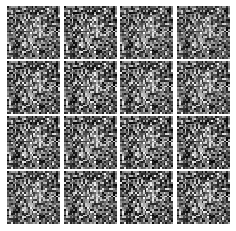

Epoch: 0, Iter: 40, D: 0.1551, G:1.062
image shape: {} (16, 784)


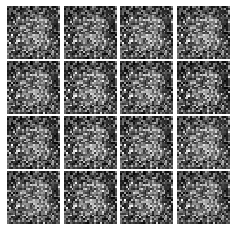

Epoch: 0, Iter: 60, D: 0.1015, G:0.7438
image shape: {} (16, 784)


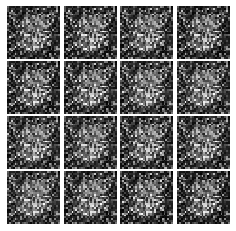

Epoch: 0, Iter: 80, D: 0.1993, G:0.6235
image shape: {} (16, 784)


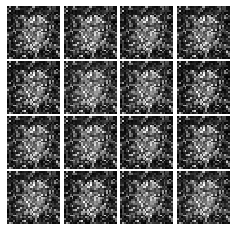

Epoch: 0, Iter: 100, D: 0.2083, G:0.233
image shape: {} (16, 784)


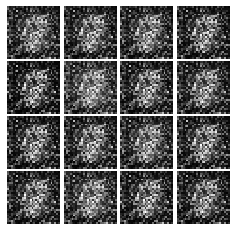

Epoch: 0, Iter: 120, D: 0.1608, G:1.673
image shape: {} (16, 784)


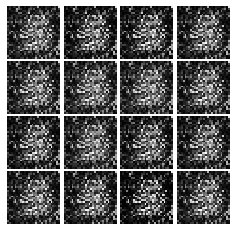

Epoch: 0, Iter: 140, D: 0.193, G:0.8684
image shape: {} (16, 784)


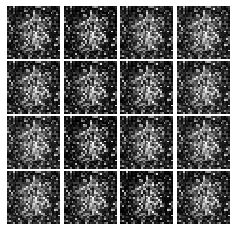

Epoch: 0, Iter: 160, D: 0.05068, G:0.3958
image shape: {} (16, 784)


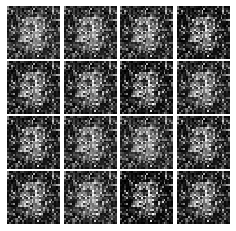

Epoch: 0, Iter: 180, D: 0.05955, G:0.5108
image shape: {} (16, 784)


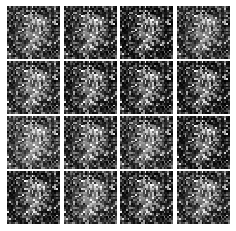

Epoch: 0, Iter: 200, D: 0.1894, G:0.8263
image shape: {} (16, 784)


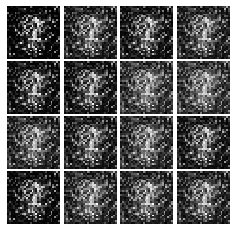

Epoch: 0, Iter: 220, D: 0.1042, G:0.3649
image shape: {} (16, 784)


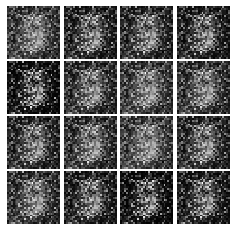

Epoch: 0, Iter: 240, D: 0.08108, G:0.9481
image shape: {} (16, 784)


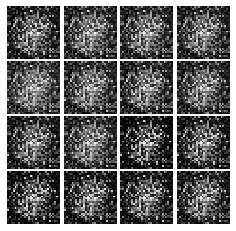

Epoch: 0, Iter: 260, D: 0.1207, G:0.5411
image shape: {} (16, 784)


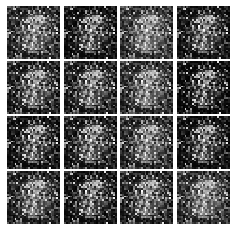

Epoch: 0, Iter: 280, D: 0.06277, G:0.5787
image shape: {} (16, 784)


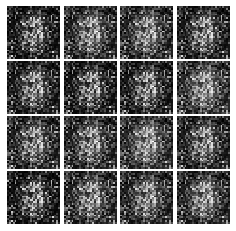

Epoch: 0, Iter: 300, D: 0.07727, G:0.5523
image shape: {} (16, 784)


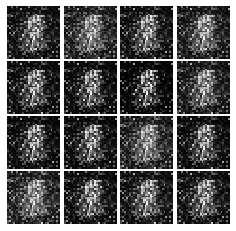

Epoch: 0, Iter: 320, D: 0.1111, G:0.5595
image shape: {} (16, 784)


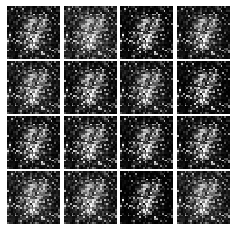

Epoch: 0, Iter: 340, D: 0.06919, G:1.052
image shape: {} (16, 784)


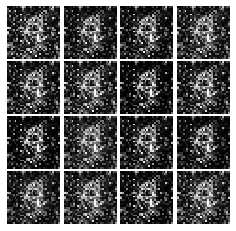

Epoch: 0, Iter: 360, D: 0.06412, G:0.4978
image shape: {} (16, 784)


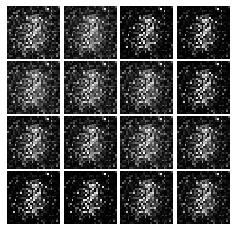

Epoch: 0, Iter: 380, D: 0.205, G:0.6471
image shape: {} (16, 784)


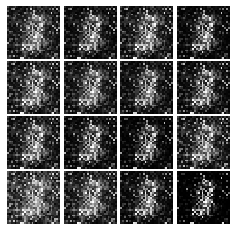

Epoch: 0, Iter: 400, D: 0.06915, G:0.139
image shape: {} (16, 784)


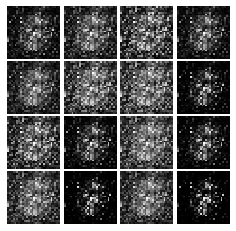

Epoch: 0, Iter: 420, D: 0.1131, G:0.4935
image shape: {} (16, 784)


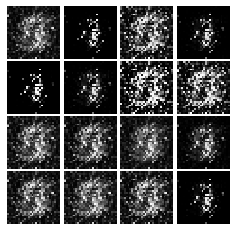

Epoch: 0, Iter: 440, D: 0.08103, G:0.3852
image shape: {} (16, 784)


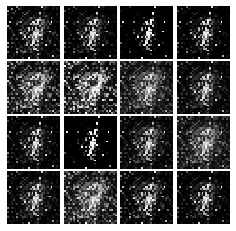

Epoch: 0, Iter: 460, D: 0.04193, G:0.6094
image shape: {} (16, 784)


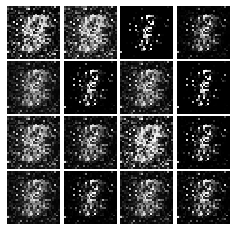

Epoch: 1, Iter: 480, D: 0.1012, G:0.3896
image shape: {} (16, 784)


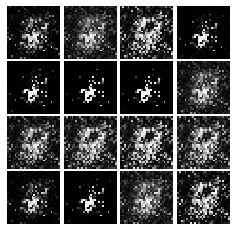

Epoch: 1, Iter: 500, D: 0.171, G:0.1196
image shape: {} (16, 784)


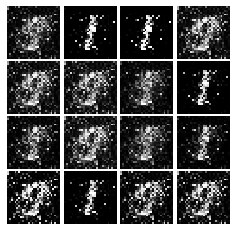

Epoch: 1, Iter: 520, D: 0.09185, G:0.4395
image shape: {} (16, 784)


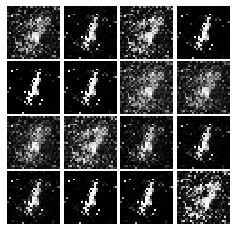

Epoch: 1, Iter: 540, D: 0.06552, G:0.3551
image shape: {} (16, 784)


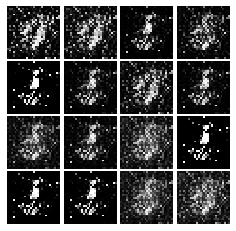

Epoch: 1, Iter: 560, D: 0.05516, G:0.4699
image shape: {} (16, 784)


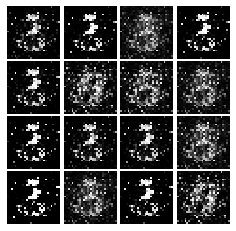

Epoch: 1, Iter: 580, D: 0.09593, G:0.5761
image shape: {} (16, 784)


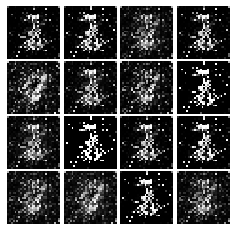

Epoch: 1, Iter: 600, D: 0.04871, G:0.4627
image shape: {} (16, 784)


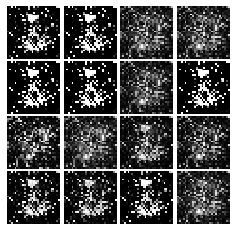

Epoch: 1, Iter: 620, D: 0.05671, G:0.6644
image shape: {} (16, 784)


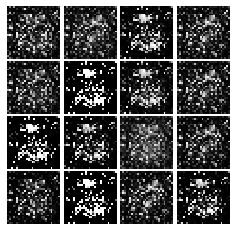

Epoch: 1, Iter: 640, D: 0.04995, G:0.6657
image shape: {} (16, 784)


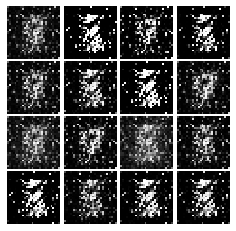

Epoch: 1, Iter: 660, D: 0.0762, G:0.392
image shape: {} (16, 784)


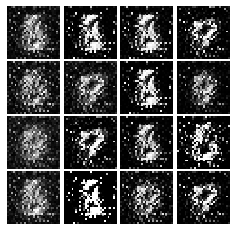

Epoch: 1, Iter: 680, D: 0.1028, G:0.5988
image shape: {} (16, 784)


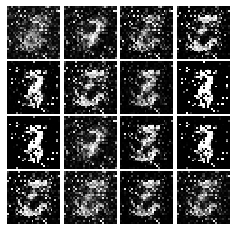

Epoch: 1, Iter: 700, D: 0.06115, G:0.3827
image shape: {} (16, 784)


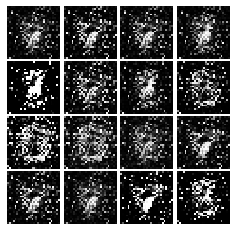

Epoch: 1, Iter: 720, D: 0.07646, G:0.3725
image shape: {} (16, 784)


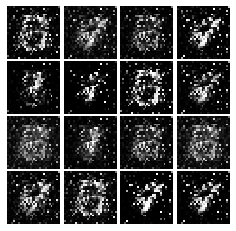

Epoch: 1, Iter: 740, D: 0.1987, G:0.7247
image shape: {} (16, 784)


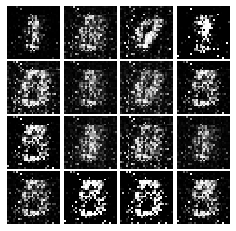

Epoch: 1, Iter: 760, D: 0.1073, G:0.2854
image shape: {} (16, 784)


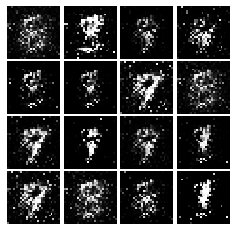

Epoch: 1, Iter: 780, D: 0.1604, G:0.5624
image shape: {} (16, 784)


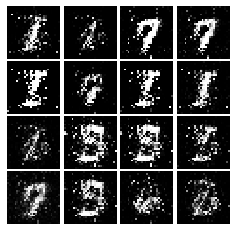

Epoch: 1, Iter: 800, D: 0.0722, G:0.4393
image shape: {} (16, 784)


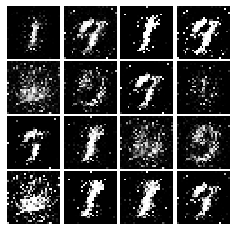

Epoch: 1, Iter: 820, D: 0.07839, G:0.2164
image shape: {} (16, 784)


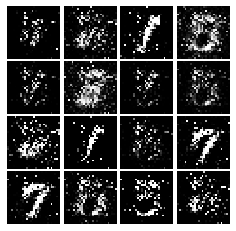

Epoch: 1, Iter: 840, D: 0.09198, G:0.3321
image shape: {} (16, 784)


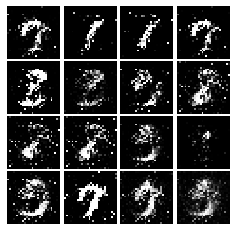

Epoch: 1, Iter: 860, D: 0.2963, G:0.3868
image shape: {} (16, 784)


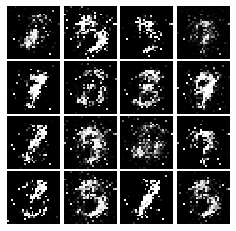

Epoch: 1, Iter: 880, D: 0.1034, G:0.4433
image shape: {} (16, 784)


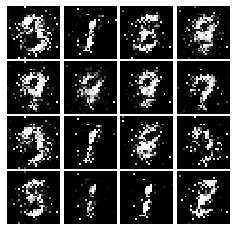

Epoch: 1, Iter: 900, D: 0.08544, G:0.3807
image shape: {} (16, 784)


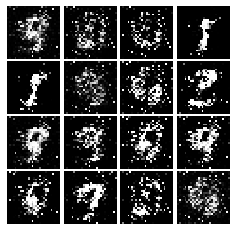

Epoch: 1, Iter: 920, D: 0.1532, G:0.5154
image shape: {} (16, 784)


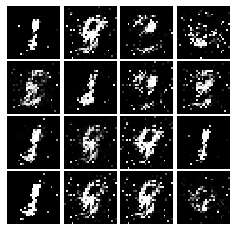

Epoch: 2, Iter: 940, D: 0.1066, G:0.3836
image shape: {} (16, 784)


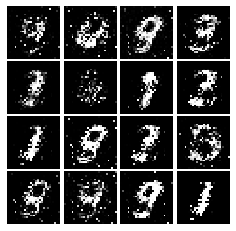

Epoch: 2, Iter: 960, D: 0.0968, G:0.2146
image shape: {} (16, 784)


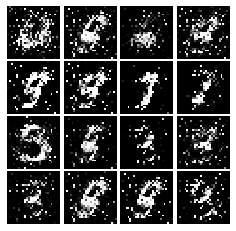

Epoch: 2, Iter: 980, D: 0.09308, G:0.407
image shape: {} (16, 784)


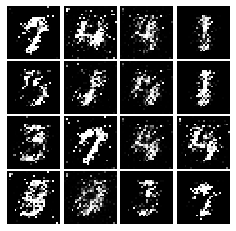

Epoch: 2, Iter: 1000, D: 0.1095, G:0.1909
image shape: {} (16, 784)


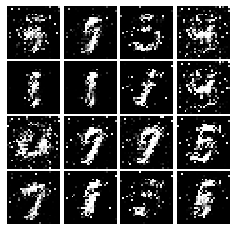

Epoch: 2, Iter: 1020, D: 0.1404, G:0.3022
image shape: {} (16, 784)


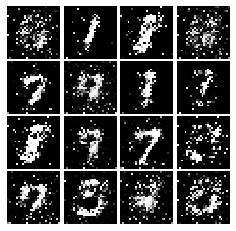

Epoch: 2, Iter: 1040, D: 0.07967, G:0.3453
image shape: {} (16, 784)


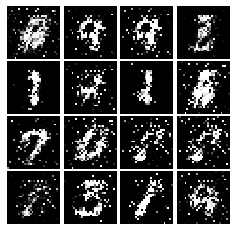

Epoch: 2, Iter: 1060, D: 0.09157, G:0.3349
image shape: {} (16, 784)


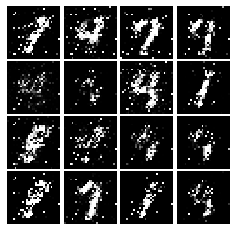

Epoch: 2, Iter: 1080, D: 0.098, G:0.2421
image shape: {} (16, 784)


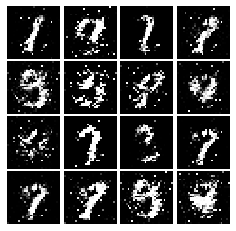

Epoch: 2, Iter: 1100, D: 0.09466, G:0.3884
image shape: {} (16, 784)


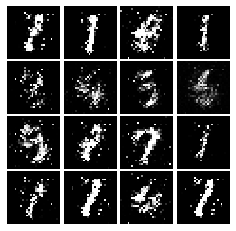

Epoch: 2, Iter: 1120, D: 0.08751, G:0.3281
image shape: {} (16, 784)


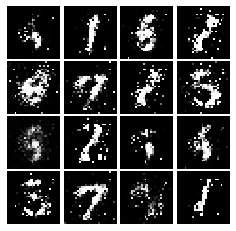

Epoch: 2, Iter: 1140, D: 0.1508, G:0.2947
image shape: {} (16, 784)


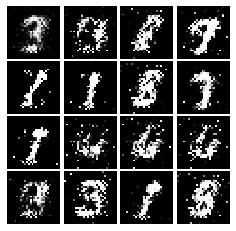

Epoch: 2, Iter: 1160, D: 0.1237, G:0.7534
image shape: {} (16, 784)


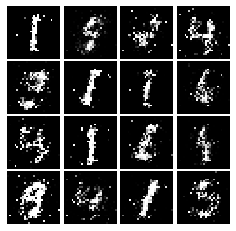

Epoch: 2, Iter: 1180, D: 0.1031, G:0.3557
image shape: {} (16, 784)


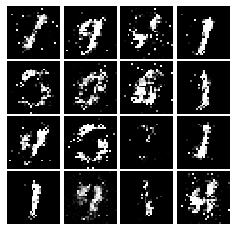

Epoch: 2, Iter: 1200, D: 0.113, G:0.3197
image shape: {} (16, 784)


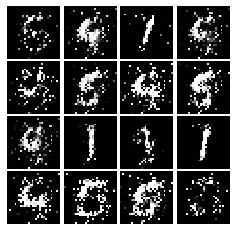

Epoch: 2, Iter: 1220, D: 0.09126, G:0.4703
image shape: {} (16, 784)


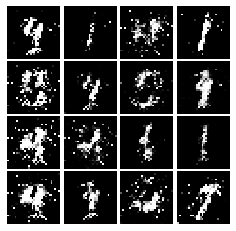

Epoch: 2, Iter: 1240, D: 0.3291, G:0.4099
image shape: {} (16, 784)


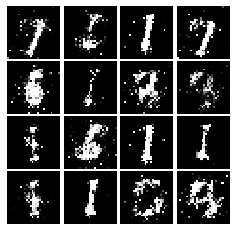

Epoch: 2, Iter: 1260, D: 0.2743, G:0.5911
image shape: {} (16, 784)


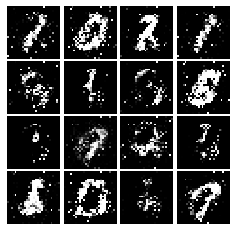

Epoch: 2, Iter: 1280, D: 0.09697, G:0.3418
image shape: {} (16, 784)


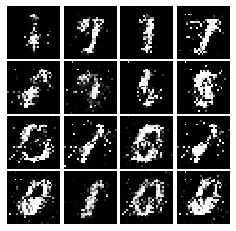

Epoch: 2, Iter: 1300, D: 0.09241, G:0.3775
image shape: {} (16, 784)


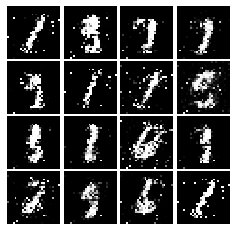

Epoch: 2, Iter: 1320, D: 0.1404, G:0.3007
image shape: {} (16, 784)


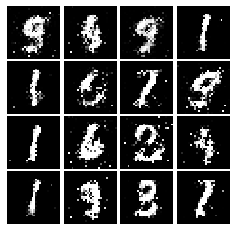

Epoch: 2, Iter: 1340, D: 0.1179, G:0.3217
image shape: {} (16, 784)


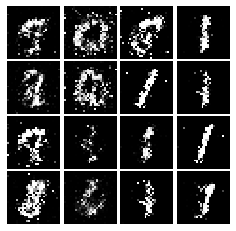

Epoch: 2, Iter: 1360, D: 0.115, G:0.2942
image shape: {} (16, 784)


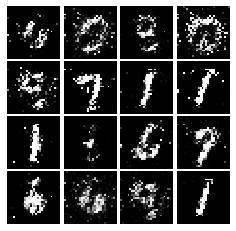

Epoch: 2, Iter: 1380, D: 0.1121, G:0.3773
image shape: {} (16, 784)


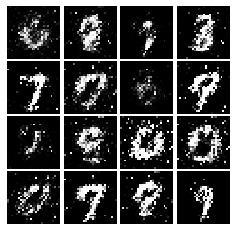

Epoch: 2, Iter: 1400, D: 0.1208, G:0.4346
image shape: {} (16, 784)


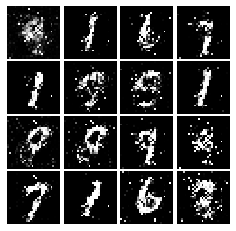

Epoch: 3, Iter: 1420, D: 0.1539, G:0.296
image shape: {} (16, 784)


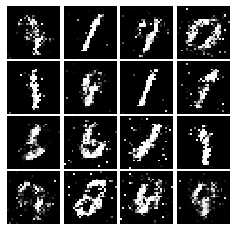

Epoch: 3, Iter: 1440, D: 0.1772, G:0.2324
image shape: {} (16, 784)


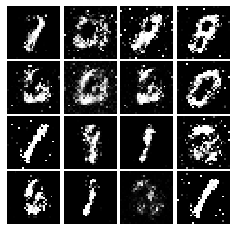

Epoch: 3, Iter: 1460, D: 0.1439, G:0.1808
image shape: {} (16, 784)


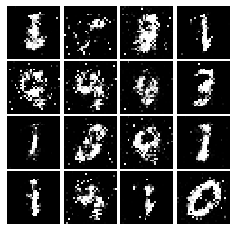

Epoch: 3, Iter: 1480, D: 0.1803, G:0.2581
image shape: {} (16, 784)


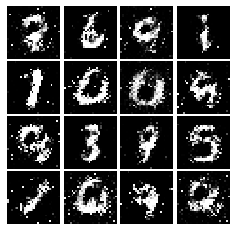

Epoch: 3, Iter: 1500, D: 0.1553, G:0.239
image shape: {} (16, 784)


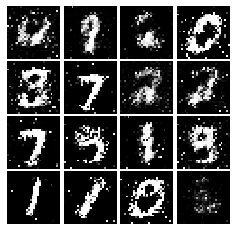

Epoch: 3, Iter: 1520, D: 0.181, G:0.2114
image shape: {} (16, 784)


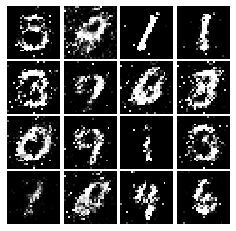

Epoch: 3, Iter: 1540, D: 0.1771, G:0.2739
image shape: {} (16, 784)


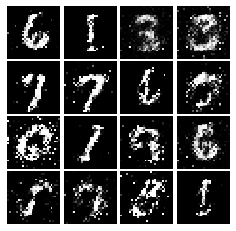

Epoch: 3, Iter: 1560, D: 0.1478, G:0.2524
image shape: {} (16, 784)


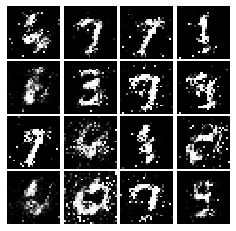

Epoch: 3, Iter: 1580, D: 0.1537, G:0.2474
image shape: {} (16, 784)


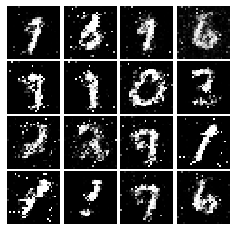

Epoch: 3, Iter: 1600, D: 0.1947, G:0.2055
image shape: {} (16, 784)


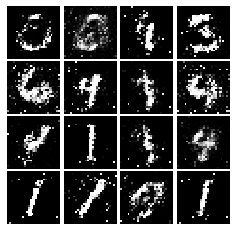

Epoch: 3, Iter: 1620, D: 0.1369, G:0.2647
image shape: {} (16, 784)


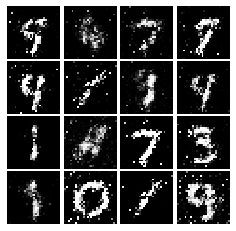

Epoch: 3, Iter: 1640, D: 0.1699, G:0.3185
image shape: {} (16, 784)


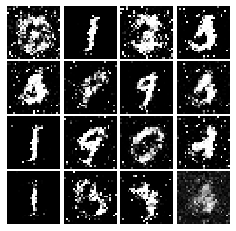

Epoch: 3, Iter: 1660, D: 0.1493, G:0.3298
image shape: {} (16, 784)


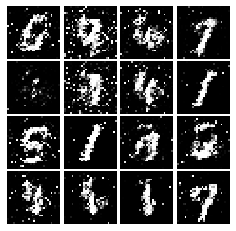

Epoch: 3, Iter: 1680, D: 0.1528, G:0.264
image shape: {} (16, 784)


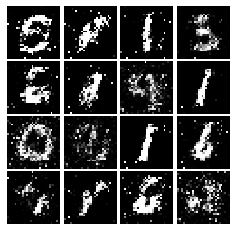

Epoch: 3, Iter: 1700, D: 0.1659, G:0.3032
image shape: {} (16, 784)


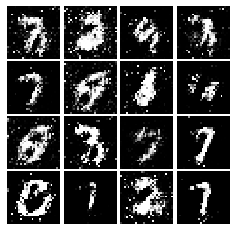

Epoch: 3, Iter: 1720, D: 0.1737, G:0.2258
image shape: {} (16, 784)


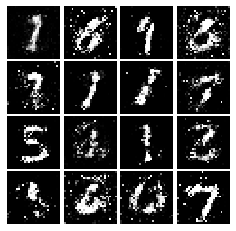

Epoch: 3, Iter: 1740, D: 0.1844, G:0.2768
image shape: {} (16, 784)


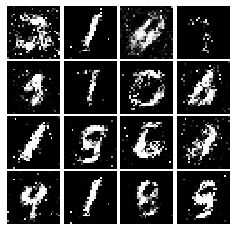

Epoch: 3, Iter: 1760, D: 0.1515, G:0.297
image shape: {} (16, 784)


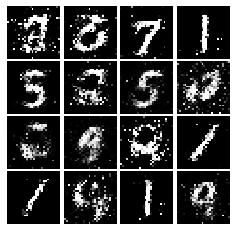

Epoch: 3, Iter: 1780, D: 0.1624, G:0.274
image shape: {} (16, 784)


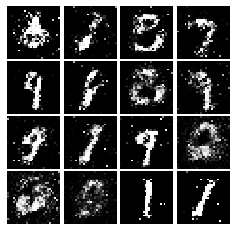

Epoch: 3, Iter: 1800, D: 0.1651, G:0.2081
image shape: {} (16, 784)


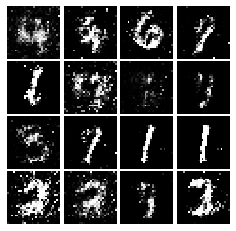

Epoch: 3, Iter: 1820, D: 0.1723, G:0.2024
image shape: {} (16, 784)


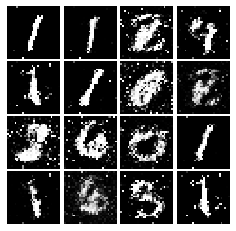

Epoch: 3, Iter: 1840, D: 0.1717, G:0.1908
image shape: {} (16, 784)


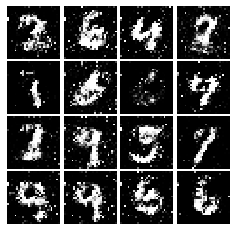

Epoch: 3, Iter: 1860, D: 0.1525, G:0.2742
image shape: {} (16, 784)


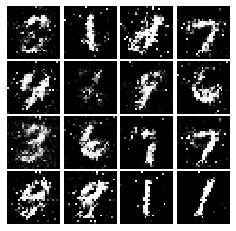

Epoch: 4, Iter: 1880, D: 0.1752, G:0.2464
image shape: {} (16, 784)


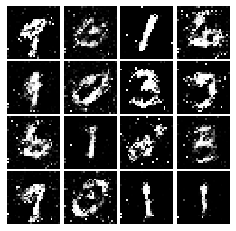

Epoch: 4, Iter: 1900, D: 0.1619, G:0.253
image shape: {} (16, 784)


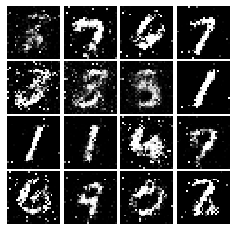

Epoch: 4, Iter: 1920, D: 0.1695, G:0.2499
image shape: {} (16, 784)


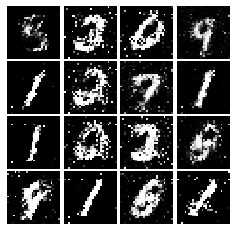

Epoch: 4, Iter: 1940, D: 0.1952, G:0.328
image shape: {} (16, 784)


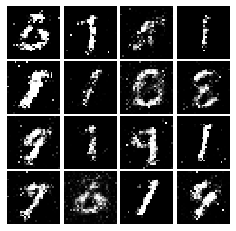

Epoch: 4, Iter: 1960, D: 0.1735, G:0.2561
image shape: {} (16, 784)


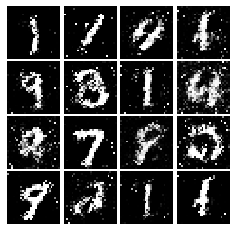

Epoch: 4, Iter: 1980, D: 0.1766, G:0.2621
image shape: {} (16, 784)


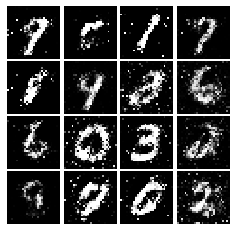

Epoch: 4, Iter: 2000, D: 0.1746, G:0.2697
image shape: {} (16, 784)


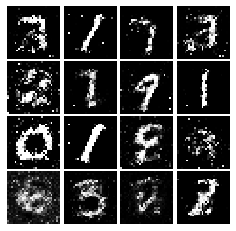

Epoch: 4, Iter: 2020, D: 0.1707, G:0.2217
image shape: {} (16, 784)


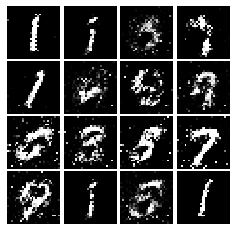

Epoch: 4, Iter: 2040, D: 0.2023, G:0.2604
image shape: {} (16, 784)


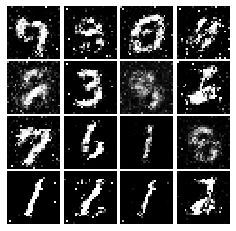

Epoch: 4, Iter: 2060, D: 0.212, G:0.2147
image shape: {} (16, 784)


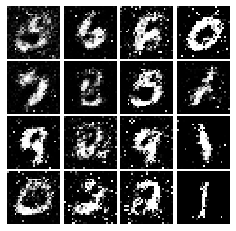

Epoch: 4, Iter: 2080, D: 0.1976, G:0.212
image shape: {} (16, 784)


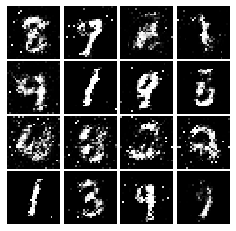

Epoch: 4, Iter: 2100, D: 0.1968, G:0.2288
image shape: {} (16, 784)


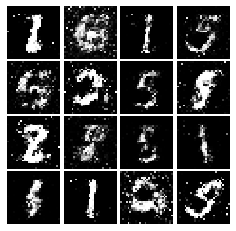

Epoch: 4, Iter: 2120, D: 0.1888, G:0.2103
image shape: {} (16, 784)


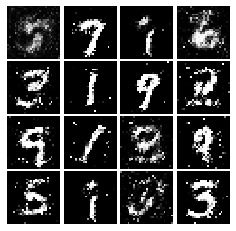

Epoch: 4, Iter: 2140, D: 0.1967, G:0.207
image shape: {} (16, 784)


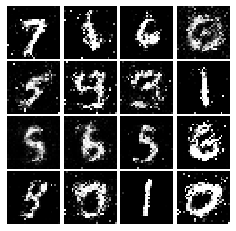

Epoch: 4, Iter: 2160, D: 0.1767, G:0.2634
image shape: {} (16, 784)


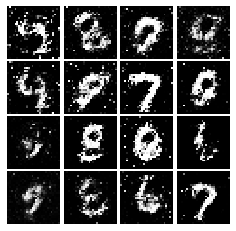

Epoch: 4, Iter: 2180, D: 0.1651, G:0.2634
image shape: {} (16, 784)


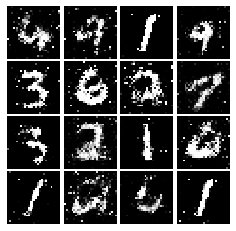

Epoch: 4, Iter: 2200, D: 0.166, G:0.2631
image shape: {} (16, 784)


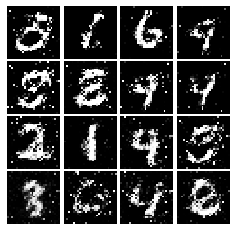

Epoch: 4, Iter: 2220, D: 0.1847, G:0.2168
image shape: {} (16, 784)


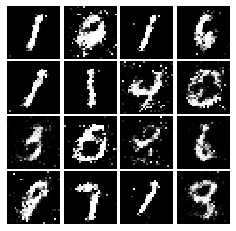

Epoch: 4, Iter: 2240, D: 0.1783, G:0.2496
image shape: {} (16, 784)


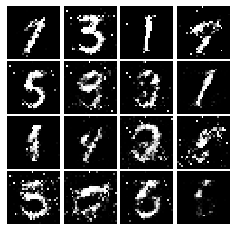

Epoch: 4, Iter: 2260, D: 0.1845, G:0.3257
image shape: {} (16, 784)


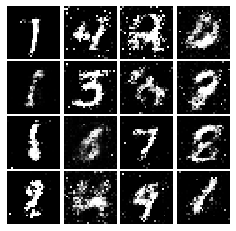

Epoch: 4, Iter: 2280, D: 0.1869, G:0.2323
image shape: {} (16, 784)


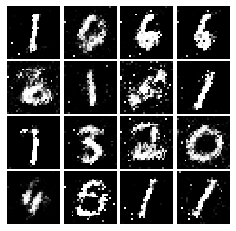

Epoch: 4, Iter: 2300, D: 0.1676, G:0.2647
image shape: {} (16, 784)


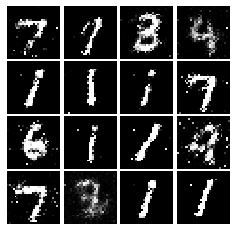

Epoch: 4, Iter: 2320, D: 0.163, G:0.3144
image shape: {} (16, 784)


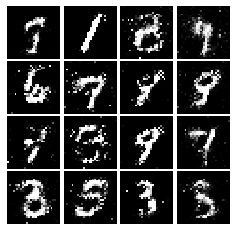

Epoch: 4, Iter: 2340, D: 0.1495, G:0.2749
image shape: {} (16, 784)


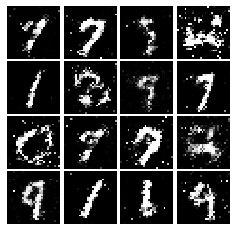

Epoch: 5, Iter: 2360, D: 0.1531, G:0.2548
image shape: {} (16, 784)


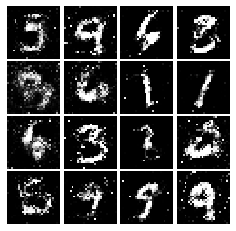

Epoch: 5, Iter: 2380, D: 0.1717, G:0.2261
image shape: {} (16, 784)


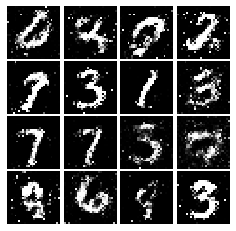

Epoch: 5, Iter: 2400, D: 0.1671, G:0.2824
image shape: {} (16, 784)


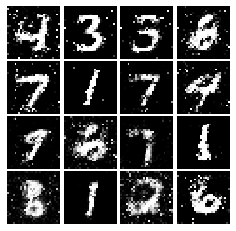

Epoch: 5, Iter: 2420, D: 0.1775, G:0.243
image shape: {} (16, 784)


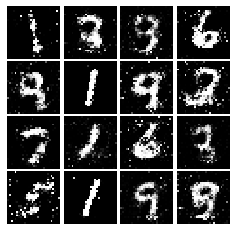

Epoch: 5, Iter: 2440, D: 0.1737, G:0.2613
image shape: {} (16, 784)


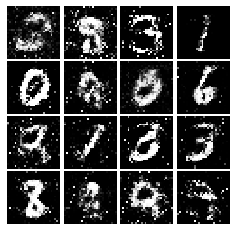

Epoch: 5, Iter: 2460, D: 0.1463, G:0.2525
image shape: {} (16, 784)


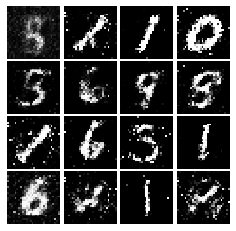

Epoch: 5, Iter: 2480, D: 0.1744, G:0.2581
image shape: {} (16, 784)


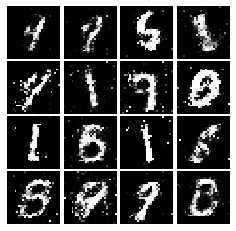

Epoch: 5, Iter: 2500, D: 0.1778, G:0.2726
image shape: {} (16, 784)


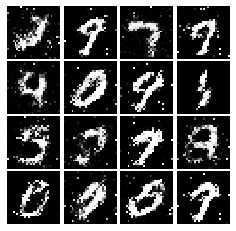

Epoch: 5, Iter: 2520, D: 0.2292, G:0.1901
image shape: {} (16, 784)


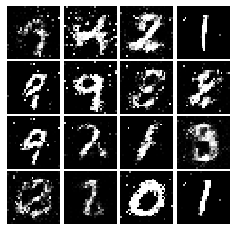

Epoch: 5, Iter: 2540, D: 0.1754, G:0.2527
image shape: {} (16, 784)


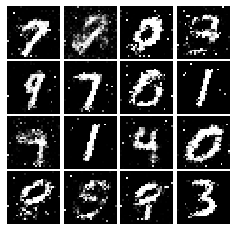

Epoch: 5, Iter: 2560, D: 0.1968, G:0.2215
image shape: {} (16, 784)


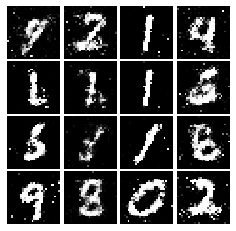

Epoch: 5, Iter: 2580, D: 0.1896, G:0.27
image shape: {} (16, 784)


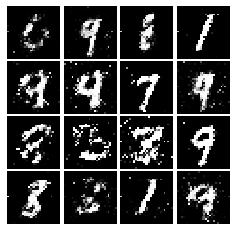

Epoch: 5, Iter: 2600, D: 0.1979, G:0.2108
image shape: {} (16, 784)


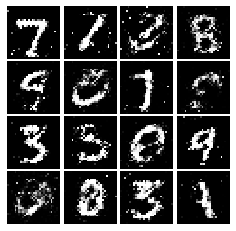

Epoch: 5, Iter: 2620, D: 0.1722, G:0.2494
image shape: {} (16, 784)


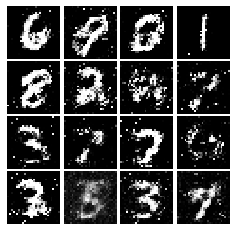

Epoch: 5, Iter: 2640, D: 0.1869, G:0.2487
image shape: {} (16, 784)


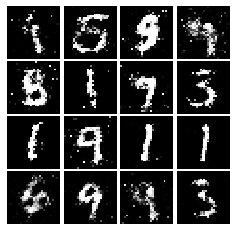

Epoch: 5, Iter: 2660, D: 0.1755, G:0.2576
image shape: {} (16, 784)


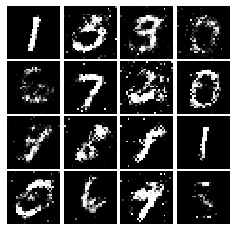

Epoch: 5, Iter: 2680, D: 0.2122, G:0.2366
image shape: {} (16, 784)


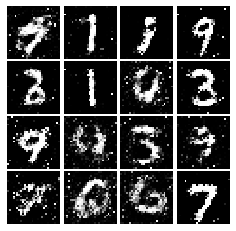

Epoch: 5, Iter: 2700, D: 0.1986, G:0.2161
image shape: {} (16, 784)


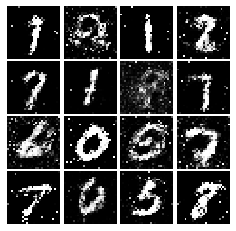

Epoch: 5, Iter: 2720, D: 0.2101, G:0.217
image shape: {} (16, 784)


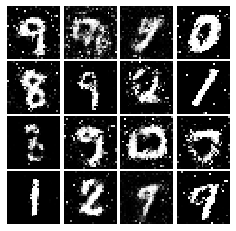

Epoch: 5, Iter: 2740, D: 0.1868, G:0.2118
image shape: {} (16, 784)


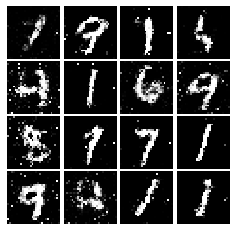

Epoch: 5, Iter: 2760, D: 0.1883, G:0.2695
image shape: {} (16, 784)


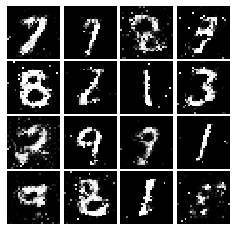

Epoch: 5, Iter: 2780, D: 0.1927, G:0.2016
image shape: {} (16, 784)


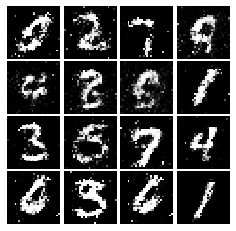

Epoch: 5, Iter: 2800, D: 0.1797, G:0.2379
image shape: {} (16, 784)


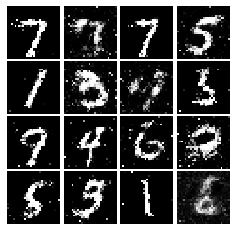

Epoch: 6, Iter: 2820, D: 0.2086, G:0.2308
image shape: {} (16, 784)


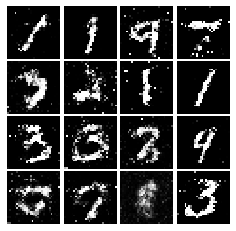

Epoch: 6, Iter: 2840, D: 0.1817, G:0.2178
image shape: {} (16, 784)


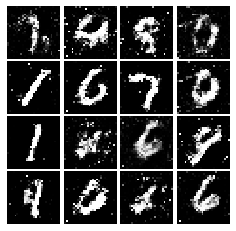

Epoch: 6, Iter: 2860, D: 0.1788, G:0.2548
image shape: {} (16, 784)


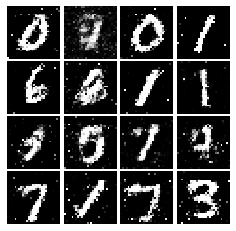

Epoch: 6, Iter: 2880, D: 0.1842, G:0.2854
image shape: {} (16, 784)


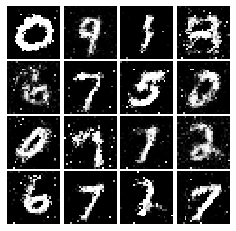

Epoch: 6, Iter: 2900, D: 0.1762, G:0.2059
image shape: {} (16, 784)


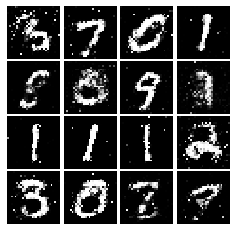

Epoch: 6, Iter: 2920, D: 0.2157, G:0.1895
image shape: {} (16, 784)


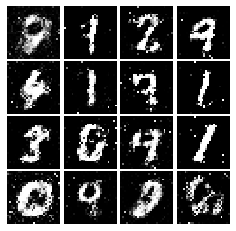

Epoch: 6, Iter: 2940, D: 0.1927, G:0.2075
image shape: {} (16, 784)


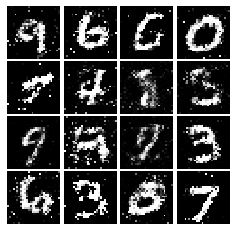

Epoch: 6, Iter: 2960, D: 0.2073, G:0.1962
image shape: {} (16, 784)


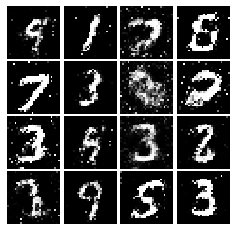

Epoch: 6, Iter: 2980, D: 0.1782, G:0.2395
image shape: {} (16, 784)


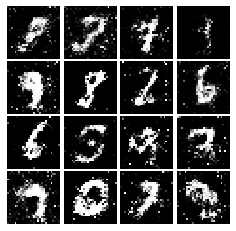

Epoch: 6, Iter: 3000, D: 0.195, G:0.2513
image shape: {} (16, 784)


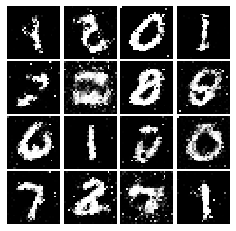

Epoch: 6, Iter: 3020, D: 0.2021, G:0.2113
image shape: {} (16, 784)


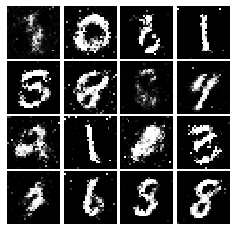

Epoch: 6, Iter: 3040, D: 0.1868, G:0.2506
image shape: {} (16, 784)


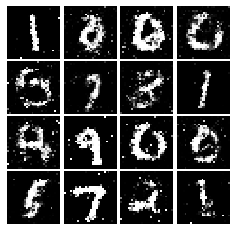

Epoch: 6, Iter: 3060, D: 0.1714, G:0.1945
image shape: {} (16, 784)


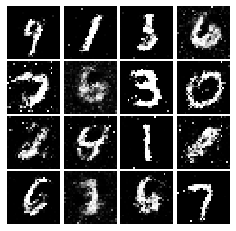

Epoch: 6, Iter: 3080, D: 0.1879, G:0.219
image shape: {} (16, 784)


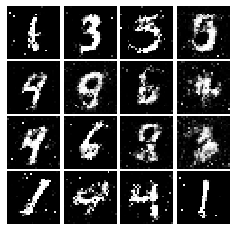

Epoch: 6, Iter: 3100, D: 0.1678, G:0.2751
image shape: {} (16, 784)


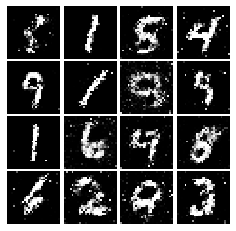

Epoch: 6, Iter: 3120, D: 0.1811, G:0.2326
image shape: {} (16, 784)


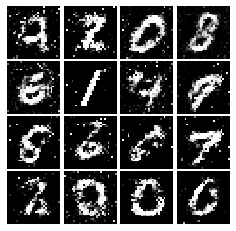

Epoch: 6, Iter: 3140, D: 0.2088, G:0.2387
image shape: {} (16, 784)


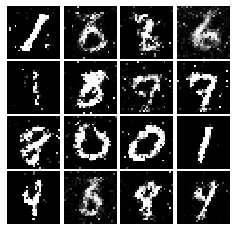

Epoch: 6, Iter: 3160, D: 0.1888, G:0.2321
image shape: {} (16, 784)


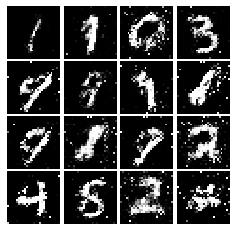

Epoch: 6, Iter: 3180, D: 0.1778, G:0.222
image shape: {} (16, 784)


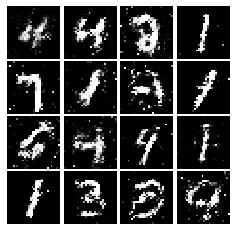

Epoch: 6, Iter: 3200, D: 0.1896, G:0.2333
image shape: {} (16, 784)


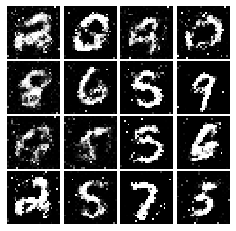

Epoch: 6, Iter: 3220, D: 0.1944, G:0.2637
image shape: {} (16, 784)


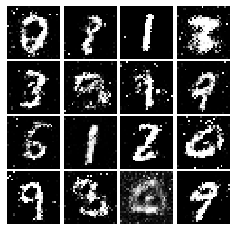

Epoch: 6, Iter: 3240, D: 0.2032, G:0.2379
image shape: {} (16, 784)


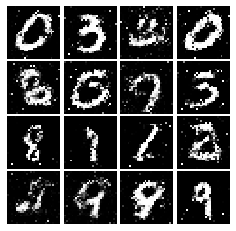

Epoch: 6, Iter: 3260, D: 0.19, G:0.2127
image shape: {} (16, 784)


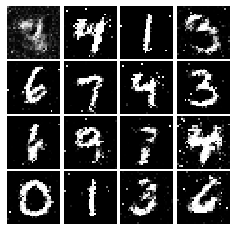

Epoch: 6, Iter: 3280, D: 0.1833, G:0.2288
image shape: {} (16, 784)


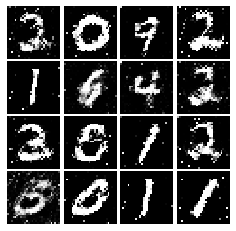

Epoch: 7, Iter: 3300, D: 0.2004, G:0.2382
image shape: {} (16, 784)


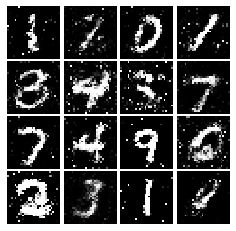

Epoch: 7, Iter: 3320, D: 0.1943, G:0.1956
image shape: {} (16, 784)


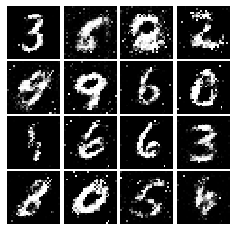

Epoch: 7, Iter: 3340, D: 0.1714, G:0.2136
image shape: {} (16, 784)


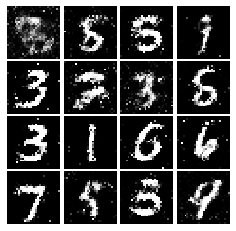

Epoch: 7, Iter: 3360, D: 0.2118, G:0.232
image shape: {} (16, 784)


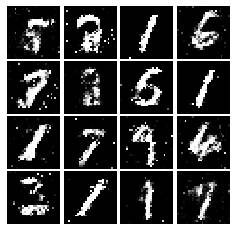

Epoch: 7, Iter: 3380, D: 0.1981, G:0.2618
image shape: {} (16, 784)


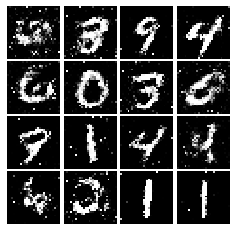

Epoch: 7, Iter: 3400, D: 0.215, G:0.2071
image shape: {} (16, 784)


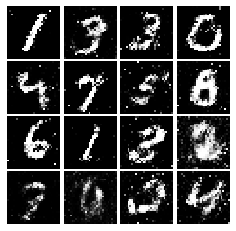

Epoch: 7, Iter: 3420, D: 0.1974, G:0.184
image shape: {} (16, 784)


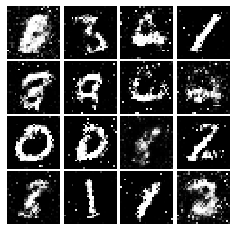

Epoch: 7, Iter: 3440, D: 0.2032, G:0.2098
image shape: {} (16, 784)


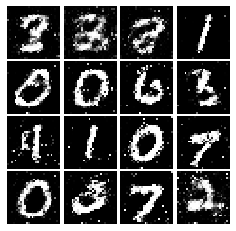

Epoch: 7, Iter: 3460, D: 0.2014, G:0.2281
image shape: {} (16, 784)


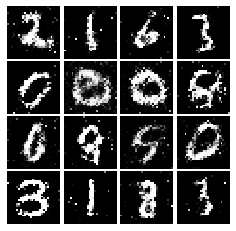

Epoch: 7, Iter: 3480, D: 0.1867, G:0.2286
image shape: {} (16, 784)


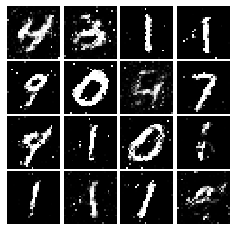

Epoch: 7, Iter: 3500, D: 0.1866, G:0.2311
image shape: {} (16, 784)


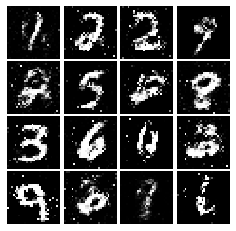

Epoch: 7, Iter: 3520, D: 0.1792, G:0.2435
image shape: {} (16, 784)


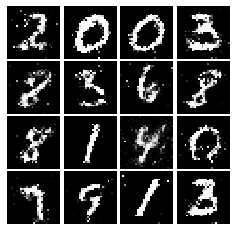

Epoch: 7, Iter: 3540, D: 0.1832, G:0.2368
image shape: {} (16, 784)


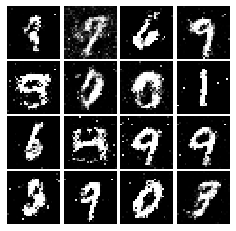

Epoch: 7, Iter: 3560, D: 0.1877, G:0.2559
image shape: {} (16, 784)


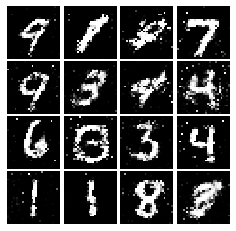

Epoch: 7, Iter: 3580, D: 0.2074, G:0.2067
image shape: {} (16, 784)


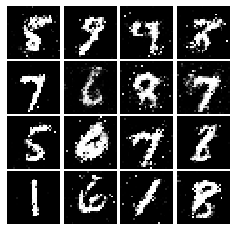

Epoch: 7, Iter: 3600, D: 0.2091, G:0.2145
image shape: {} (16, 784)


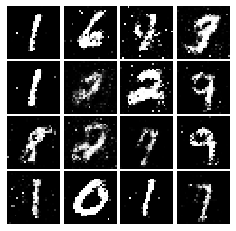

Epoch: 7, Iter: 3620, D: 0.1766, G:0.2288
image shape: {} (16, 784)


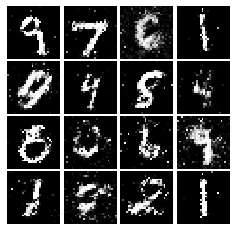

Epoch: 7, Iter: 3640, D: 0.2065, G:0.1889
image shape: {} (16, 784)


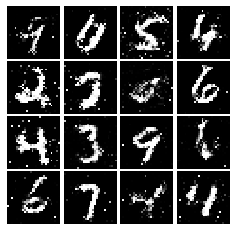

Epoch: 7, Iter: 3660, D: 0.1949, G:0.2459
image shape: {} (16, 784)


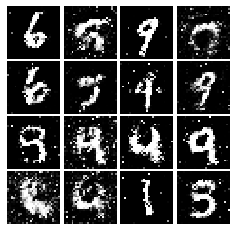

Epoch: 7, Iter: 3680, D: 0.2141, G:0.1611
image shape: {} (16, 784)


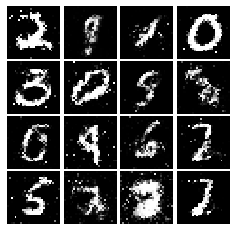

Epoch: 7, Iter: 3700, D: 0.2033, G:0.184
image shape: {} (16, 784)


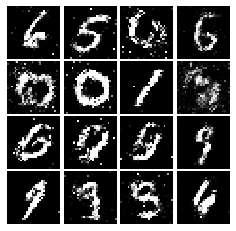

Epoch: 7, Iter: 3720, D: 0.1908, G:0.2495
image shape: {} (16, 784)


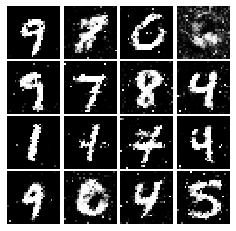

Epoch: 7, Iter: 3740, D: 0.204, G:0.1863
image shape: {} (16, 784)


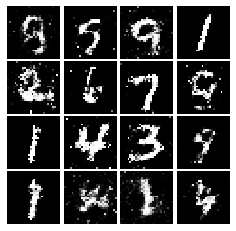

Epoch: 8, Iter: 3760, D: 0.211, G:0.2086
image shape: {} (16, 784)


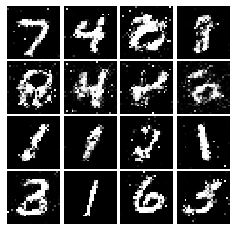

Epoch: 8, Iter: 3780, D: 0.2099, G:0.2117
image shape: {} (16, 784)


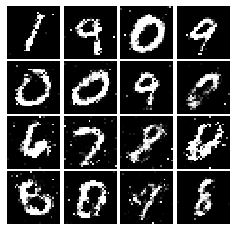

Epoch: 8, Iter: 3800, D: 0.2064, G:0.2043
image shape: {} (16, 784)


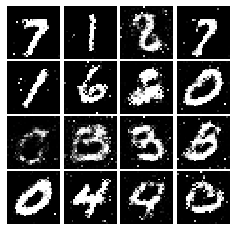

Epoch: 8, Iter: 3820, D: 0.2183, G:0.2082
image shape: {} (16, 784)


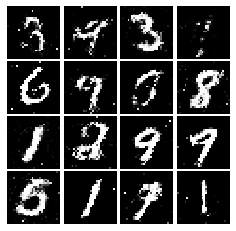

Epoch: 8, Iter: 3840, D: 0.1999, G:0.1838
image shape: {} (16, 784)


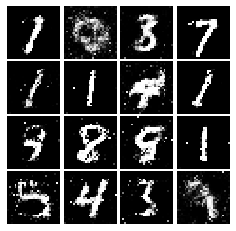

Epoch: 8, Iter: 3860, D: 0.1897, G:0.2118
image shape: {} (16, 784)


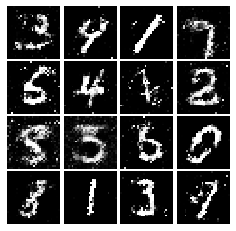

Epoch: 8, Iter: 3880, D: 0.2188, G:0.1939
image shape: {} (16, 784)


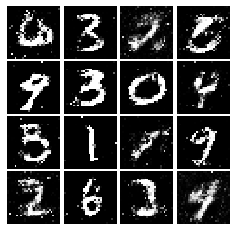

Epoch: 8, Iter: 3900, D: 0.1968, G:0.2056
image shape: {} (16, 784)


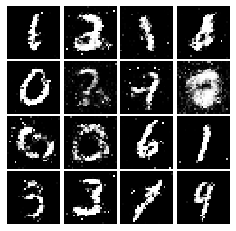

Epoch: 8, Iter: 3920, D: 0.1896, G:0.1853
image shape: {} (16, 784)


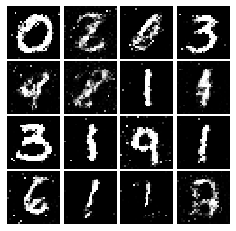

Epoch: 8, Iter: 3940, D: 0.2401, G:0.2057
image shape: {} (16, 784)


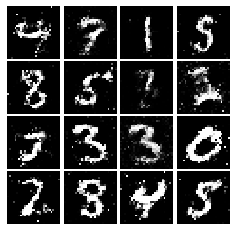

Epoch: 8, Iter: 3960, D: 0.227, G:0.192
image shape: {} (16, 784)


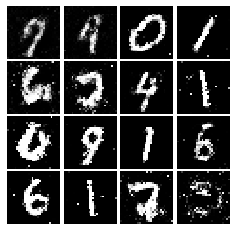

Epoch: 8, Iter: 3980, D: 0.2199, G:0.1778
image shape: {} (16, 784)


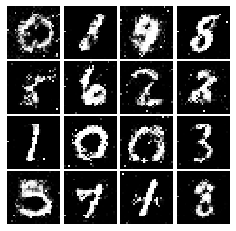

Epoch: 8, Iter: 4000, D: 0.2203, G:0.2384
image shape: {} (16, 784)


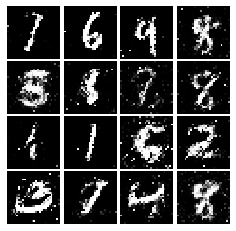

Epoch: 8, Iter: 4020, D: 0.2202, G:0.1866
image shape: {} (16, 784)


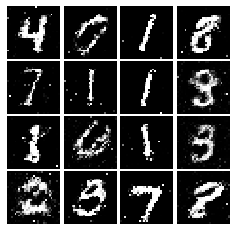

Epoch: 8, Iter: 4040, D: 0.2087, G:0.186
image shape: {} (16, 784)


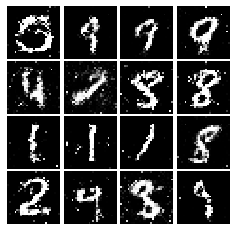

Epoch: 8, Iter: 4060, D: 0.2058, G:0.204
image shape: {} (16, 784)


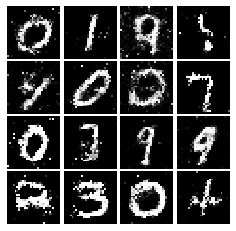

Epoch: 8, Iter: 4080, D: 0.2168, G:0.2017
image shape: {} (16, 784)


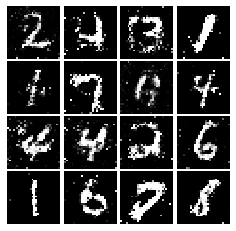

Epoch: 8, Iter: 4100, D: 0.2131, G:0.1706
image shape: {} (16, 784)


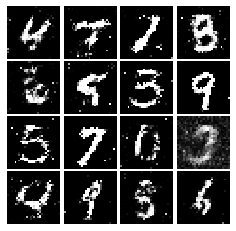

Epoch: 8, Iter: 4120, D: 0.2223, G:0.1928
image shape: {} (16, 784)


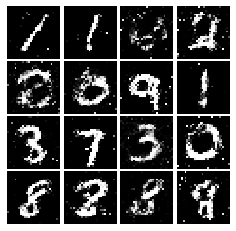

Epoch: 8, Iter: 4140, D: 0.2086, G:0.2044
image shape: {} (16, 784)


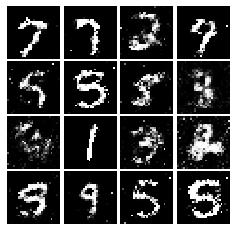

Epoch: 8, Iter: 4160, D: 0.2094, G:0.1978
image shape: {} (16, 784)


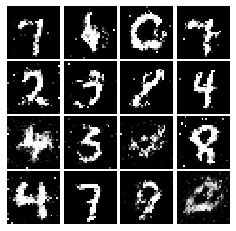

Epoch: 8, Iter: 4180, D: 0.2139, G:0.2361
image shape: {} (16, 784)


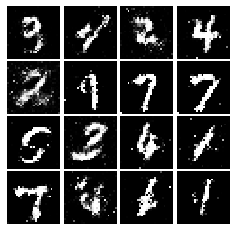

Epoch: 8, Iter: 4200, D: 0.2027, G:0.2009
image shape: {} (16, 784)


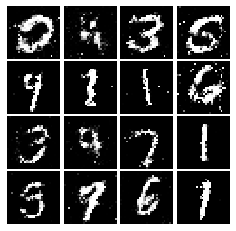

Epoch: 8, Iter: 4220, D: 0.1898, G:0.254
image shape: {} (16, 784)


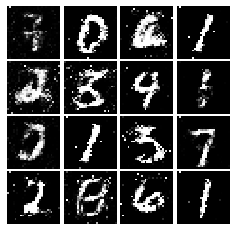

Epoch: 9, Iter: 4240, D: 0.2055, G:0.2641
image shape: {} (16, 784)


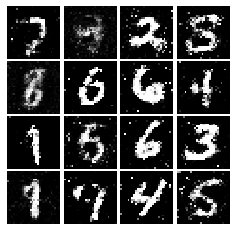

Epoch: 9, Iter: 4260, D: 0.218, G:0.1966
image shape: {} (16, 784)


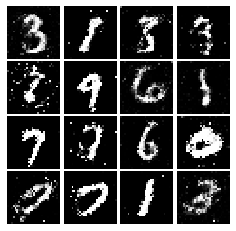

Epoch: 9, Iter: 4280, D: 0.1956, G:0.2504
image shape: {} (16, 784)


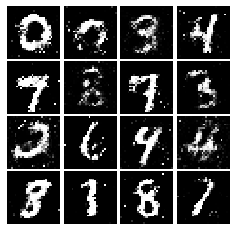

Epoch: 9, Iter: 4300, D: 0.2236, G:0.2122
image shape: {} (16, 784)


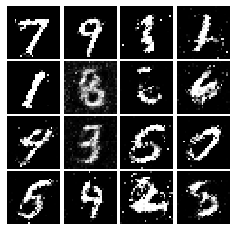

Epoch: 9, Iter: 4320, D: 0.2241, G:0.2045
image shape: {} (16, 784)


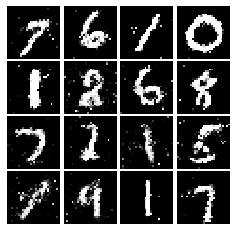

Epoch: 9, Iter: 4340, D: 0.207, G:0.2073
image shape: {} (16, 784)


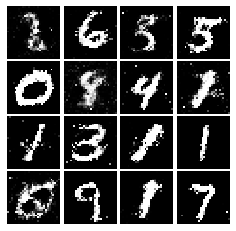

Epoch: 9, Iter: 4360, D: 0.2069, G:0.2145
image shape: {} (16, 784)


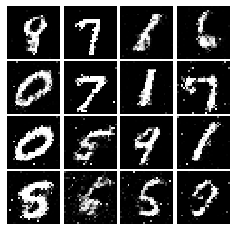

Epoch: 9, Iter: 4380, D: 0.2268, G:0.168
image shape: {} (16, 784)


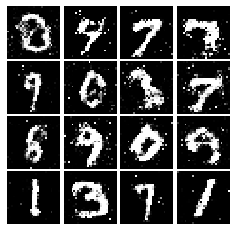

Epoch: 9, Iter: 4400, D: 0.1881, G:0.2529
image shape: {} (16, 784)


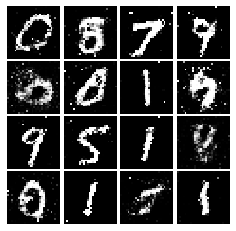

Epoch: 9, Iter: 4420, D: 0.2069, G:0.207
image shape: {} (16, 784)


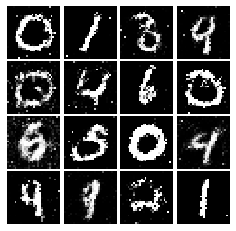

Epoch: 9, Iter: 4440, D: 0.2161, G:0.19
image shape: {} (16, 784)


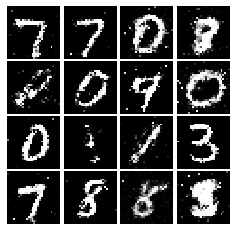

Epoch: 9, Iter: 4460, D: 0.2146, G:0.2013
image shape: {} (16, 784)


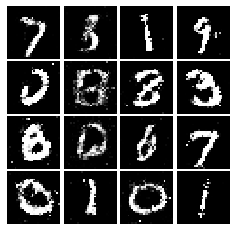

Epoch: 9, Iter: 4480, D: 0.1883, G:0.2182
image shape: {} (16, 784)


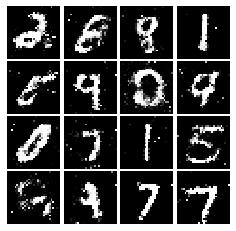

Epoch: 9, Iter: 4500, D: 0.233, G:0.1836
image shape: {} (16, 784)


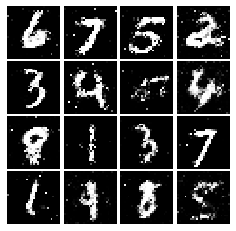

Epoch: 9, Iter: 4520, D: 0.2014, G:0.2216
image shape: {} (16, 784)


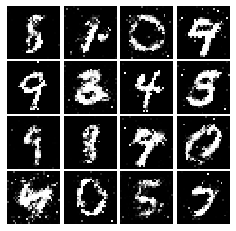

Epoch: 9, Iter: 4540, D: 0.2099, G:0.1914
image shape: {} (16, 784)


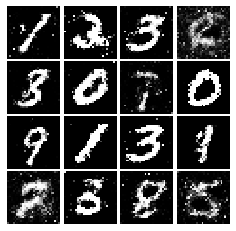

Epoch: 9, Iter: 4560, D: 0.1937, G:0.2143
image shape: {} (16, 784)


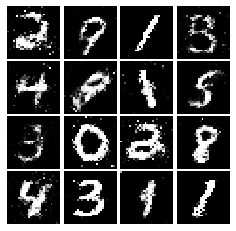

Epoch: 9, Iter: 4580, D: 0.211, G:0.1902
image shape: {} (16, 784)


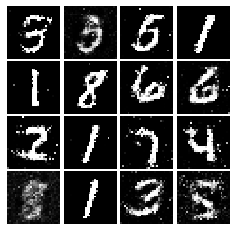

Epoch: 9, Iter: 4600, D: 0.2124, G:0.2096
image shape: {} (16, 784)


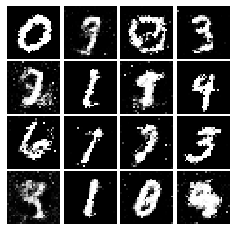

Epoch: 9, Iter: 4620, D: 0.2377, G:0.2063
image shape: {} (16, 784)


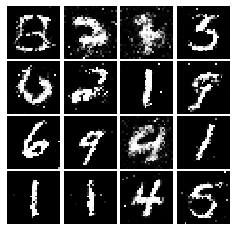

Epoch: 9, Iter: 4640, D: 0.2303, G:0.201
image shape: {} (16, 784)


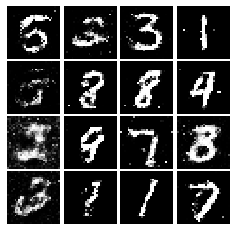

Epoch: 9, Iter: 4660, D: 0.2064, G:0.2008
image shape: {} (16, 784)


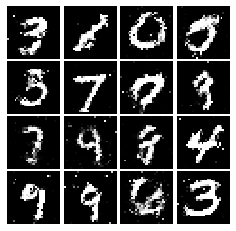

Epoch: 9, Iter: 4680, D: 0.2248, G:0.24
image shape: {} (16, 784)


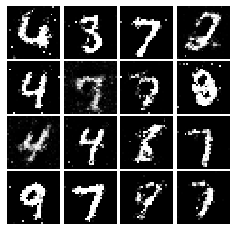

Final images
image shape: {} (16, 784)


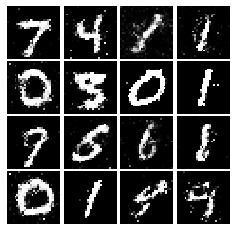

In [96]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [116]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28,28,1,), input_shape=(784,)),
        tf.keras.layers.Conv2D(32, (5,5), strides=(1,1), padding='VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D(),
        tf.keras.layers.Conv2D(64, (5,5), strides=(1,1), padding='VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D(),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [119]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    model.add(tf.keras.layers.Dense(1024, activation='relu', input_shape=[96,]))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(7*7*128, activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Reshape((7,7,128,)))
    model.add(tf.keras.layers.Conv2DTranspose(64,(4,4), strides=(2,2), padding='same', activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Conv2DTranspose(1,(4,4), strides=(2,2), padding='same', activation='tanh'))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Incorrect number of parameters in generator. 6689729 instead of 6595521. Check your achitecture.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.399, G:0.6614
image shape: {} (16, 28, 28, 1)


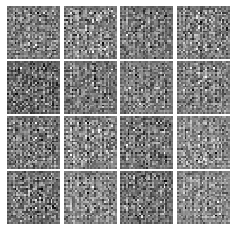

Epoch: 0, Iter: 20, D: 0.3541, G:1.427
image shape: {} (16, 28, 28, 1)


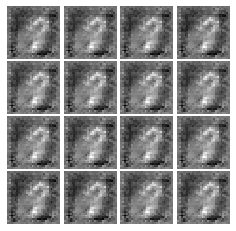

Epoch: 0, Iter: 40, D: 0.09491, G:2.984
image shape: {} (16, 28, 28, 1)


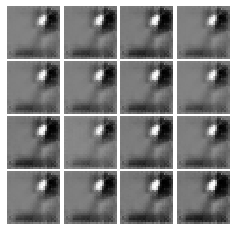

Epoch: 0, Iter: 60, D: 0.1858, G:4.404
image shape: {} (16, 28, 28, 1)


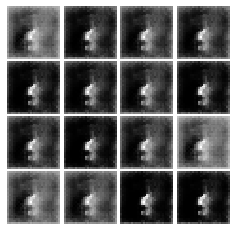

Epoch: 0, Iter: 80, D: 0.4824, G:2.525
image shape: {} (16, 28, 28, 1)


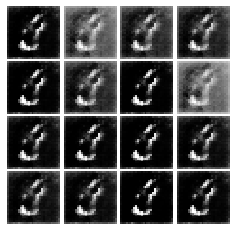

Epoch: 0, Iter: 100, D: 0.2271, G:3.254
image shape: {} (16, 28, 28, 1)


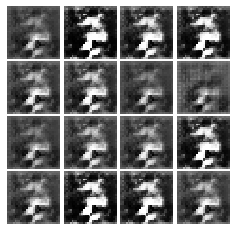

Epoch: 0, Iter: 120, D: 0.05548, G:4.163
image shape: {} (16, 28, 28, 1)


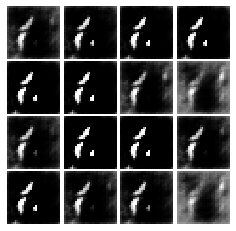

Epoch: 0, Iter: 140, D: 1.283, G:2.167
image shape: {} (16, 28, 28, 1)


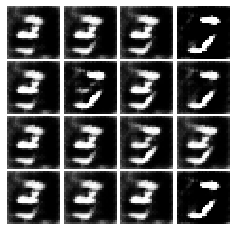

Epoch: 0, Iter: 160, D: 0.5638, G:2.242
image shape: {} (16, 28, 28, 1)


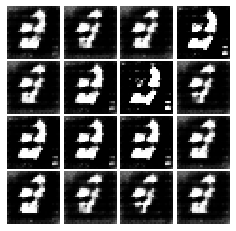

Epoch: 0, Iter: 180, D: 0.9159, G:3.169
image shape: {} (16, 28, 28, 1)


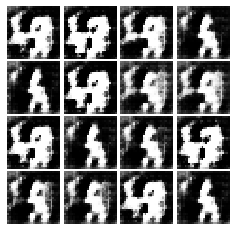

Epoch: 0, Iter: 200, D: 1.394, G:4.848
image shape: {} (16, 28, 28, 1)


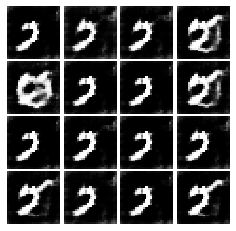

Epoch: 0, Iter: 220, D: 0.6213, G:2.779
image shape: {} (16, 28, 28, 1)


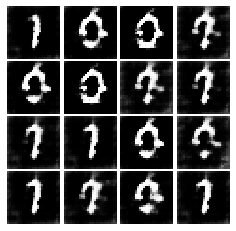

Epoch: 0, Iter: 240, D: 0.3214, G:3.245
image shape: {} (16, 28, 28, 1)


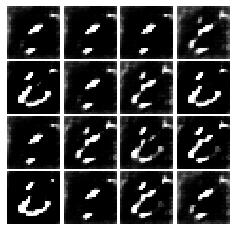

Epoch: 0, Iter: 260, D: 0.6607, G:0.6105
image shape: {} (16, 28, 28, 1)


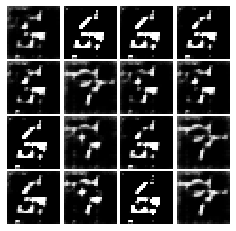

Epoch: 0, Iter: 280, D: 0.7089, G:2.321
image shape: {} (16, 28, 28, 1)


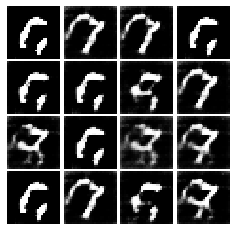

Epoch: 0, Iter: 300, D: 0.2257, G:3.098
image shape: {} (16, 28, 28, 1)


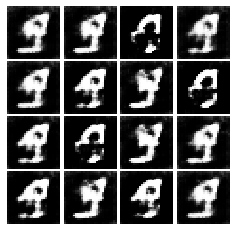

Epoch: 0, Iter: 320, D: 0.8952, G:3.946
image shape: {} (16, 28, 28, 1)


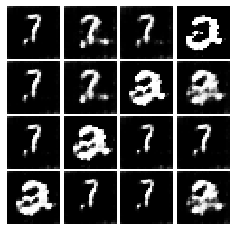

Epoch: 0, Iter: 340, D: 0.2421, G:2.893
image shape: {} (16, 28, 28, 1)


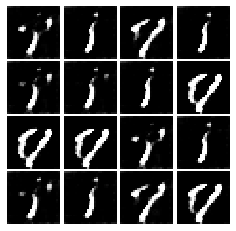

Epoch: 0, Iter: 360, D: 0.4605, G:3.331
image shape: {} (16, 28, 28, 1)


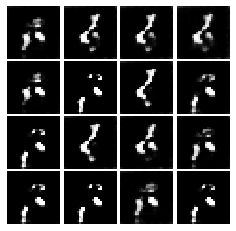

Epoch: 0, Iter: 380, D: 0.4534, G:2.853
image shape: {} (16, 28, 28, 1)


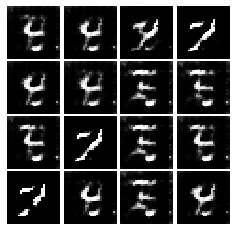

Epoch: 0, Iter: 400, D: 0.7631, G:2.354
image shape: {} (16, 28, 28, 1)


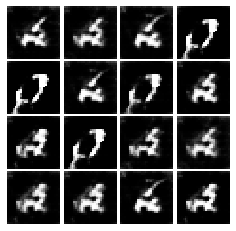

Epoch: 0, Iter: 420, D: 0.4193, G:3.35
image shape: {} (16, 28, 28, 1)


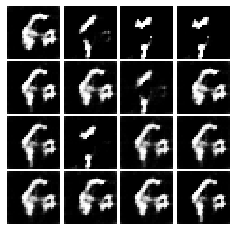

Epoch: 0, Iter: 440, D: 0.3704, G:2.411
image shape: {} (16, 28, 28, 1)


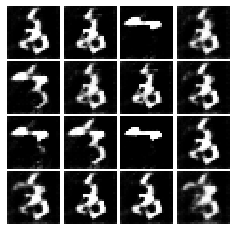

Epoch: 0, Iter: 460, D: 0.2112, G:3.889
image shape: {} (16, 28, 28, 1)


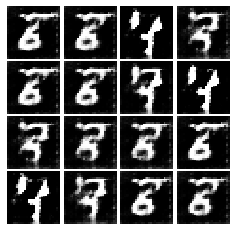

Epoch: 1, Iter: 480, D: 0.3701, G:3.104
image shape: {} (16, 28, 28, 1)


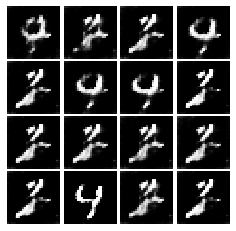

Epoch: 1, Iter: 500, D: 0.2612, G:3.358
image shape: {} (16, 28, 28, 1)


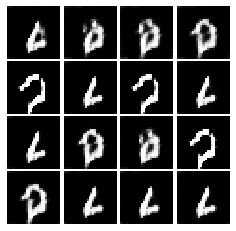

Epoch: 1, Iter: 520, D: 0.3824, G:3.271
image shape: {} (16, 28, 28, 1)


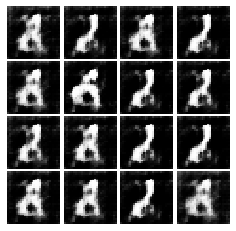

Epoch: 1, Iter: 540, D: 0.4476, G:2.655
image shape: {} (16, 28, 28, 1)


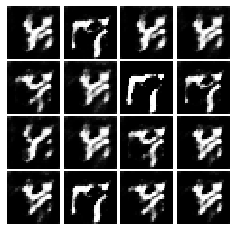

Epoch: 1, Iter: 560, D: 0.421, G:2.552
image shape: {} (16, 28, 28, 1)


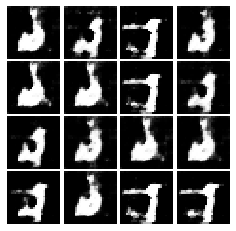

Epoch: 1, Iter: 580, D: 0.2003, G:3.263
image shape: {} (16, 28, 28, 1)


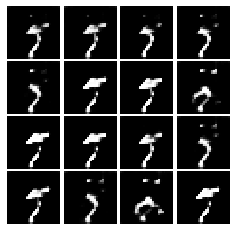

Epoch: 1, Iter: 600, D: 0.7008, G:5.557
image shape: {} (16, 28, 28, 1)


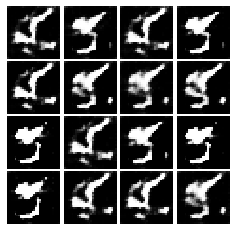

Epoch: 1, Iter: 620, D: 0.4924, G:3.154
image shape: {} (16, 28, 28, 1)


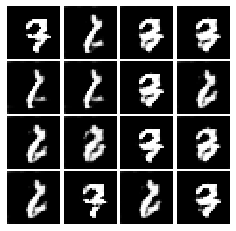

Epoch: 1, Iter: 640, D: 0.3371, G:2.965
image shape: {} (16, 28, 28, 1)


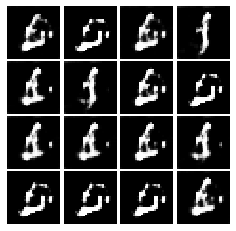

Epoch: 1, Iter: 660, D: 0.693, G:5.354
image shape: {} (16, 28, 28, 1)


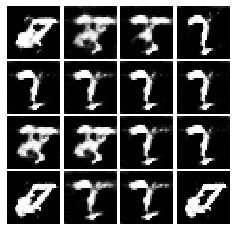

Epoch: 1, Iter: 680, D: 0.3082, G:3.246
image shape: {} (16, 28, 28, 1)


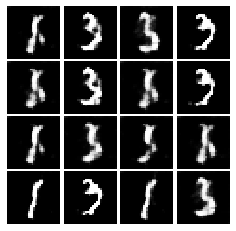

Epoch: 1, Iter: 700, D: 0.3734, G:3.399
image shape: {} (16, 28, 28, 1)


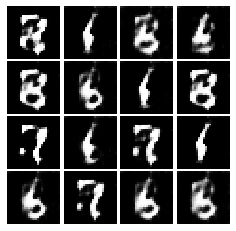

Epoch: 1, Iter: 720, D: 0.2193, G:2.195
image shape: {} (16, 28, 28, 1)


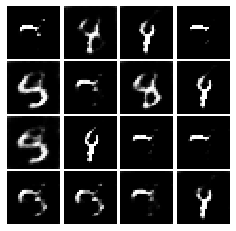

Epoch: 1, Iter: 740, D: 0.6135, G:4.334
image shape: {} (16, 28, 28, 1)


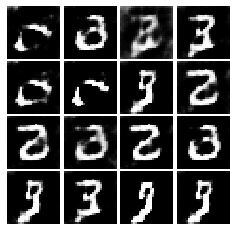

Epoch: 1, Iter: 760, D: 0.3079, G:3.177
image shape: {} (16, 28, 28, 1)


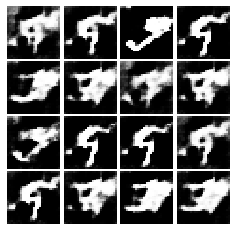

Epoch: 1, Iter: 780, D: 0.4663, G:1.955
image shape: {} (16, 28, 28, 1)


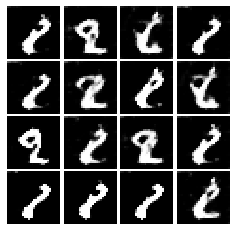

Epoch: 1, Iter: 800, D: 0.2807, G:3.456
image shape: {} (16, 28, 28, 1)


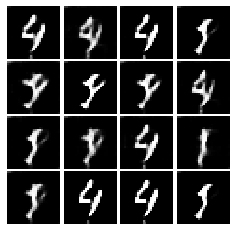

Epoch: 1, Iter: 820, D: 0.3638, G:2.544
image shape: {} (16, 28, 28, 1)


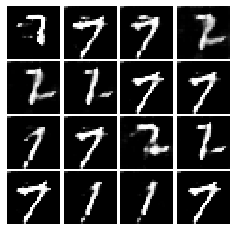

Epoch: 1, Iter: 840, D: 0.5224, G:5.339
image shape: {} (16, 28, 28, 1)


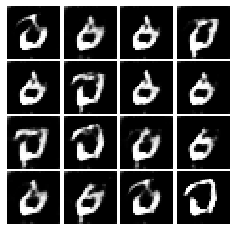

Epoch: 1, Iter: 860, D: 0.3574, G:3.021
image shape: {} (16, 28, 28, 1)


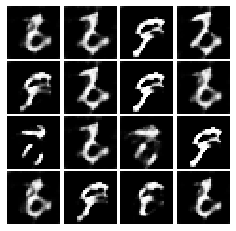

Epoch: 1, Iter: 880, D: 0.3749, G:3.036
image shape: {} (16, 28, 28, 1)


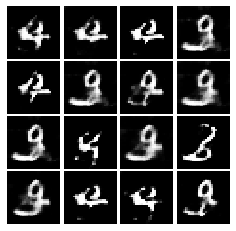

Epoch: 1, Iter: 900, D: 0.3733, G:3.443
image shape: {} (16, 28, 28, 1)


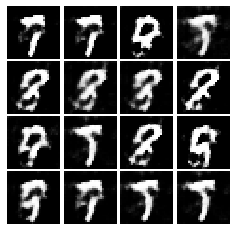

Epoch: 1, Iter: 920, D: 0.4016, G:3.425
image shape: {} (16, 28, 28, 1)


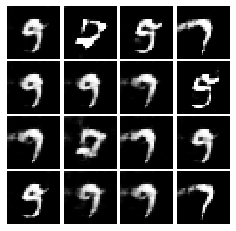

Epoch: 2, Iter: 940, D: 0.6427, G:2.438
image shape: {} (16, 28, 28, 1)


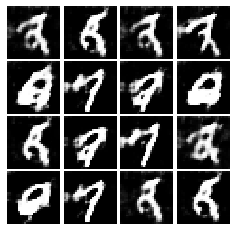

Epoch: 2, Iter: 960, D: 0.5664, G:1.803
image shape: {} (16, 28, 28, 1)


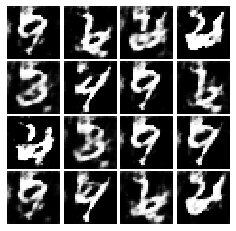

Epoch: 2, Iter: 980, D: 0.414, G:4.007
image shape: {} (16, 28, 28, 1)


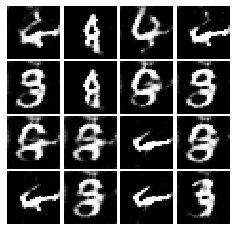

Epoch: 2, Iter: 1000, D: 0.461, G:2.477
image shape: {} (16, 28, 28, 1)


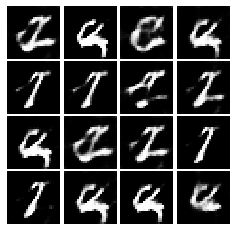

Epoch: 2, Iter: 1020, D: 0.3702, G:2.715
image shape: {} (16, 28, 28, 1)


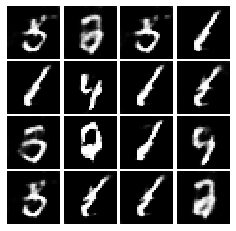

Epoch: 2, Iter: 1040, D: 0.6006, G:4.042
image shape: {} (16, 28, 28, 1)


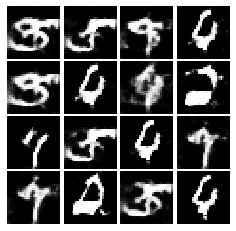

Epoch: 2, Iter: 1060, D: 0.2806, G:3.162
image shape: {} (16, 28, 28, 1)


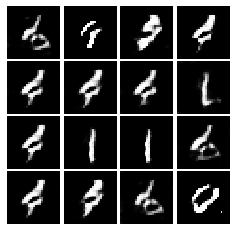

Epoch: 2, Iter: 1080, D: 0.6855, G:2.322
image shape: {} (16, 28, 28, 1)


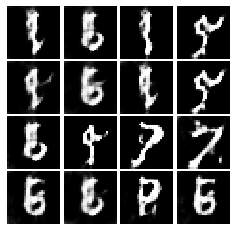

Epoch: 2, Iter: 1100, D: 0.3679, G:2.887
image shape: {} (16, 28, 28, 1)


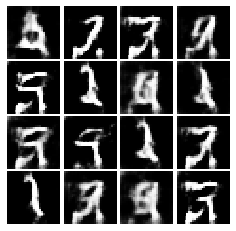

Epoch: 2, Iter: 1120, D: 0.579, G:2.323
image shape: {} (16, 28, 28, 1)


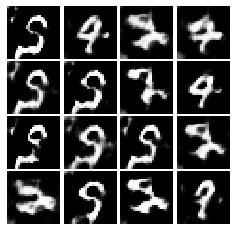

Epoch: 2, Iter: 1140, D: 0.4376, G:2.453
image shape: {} (16, 28, 28, 1)


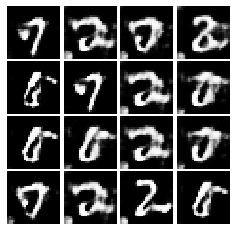

Epoch: 2, Iter: 1160, D: 0.4133, G:2.63
image shape: {} (16, 28, 28, 1)


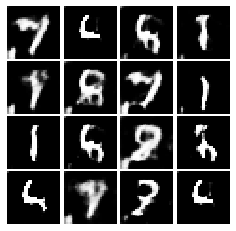

Epoch: 2, Iter: 1180, D: 0.557, G:5.328
image shape: {} (16, 28, 28, 1)


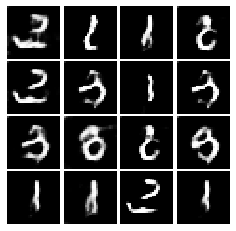

Epoch: 2, Iter: 1200, D: 0.4572, G:2.862
image shape: {} (16, 28, 28, 1)


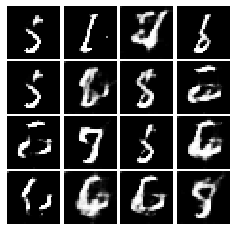

Epoch: 2, Iter: 1220, D: 0.3729, G:3.002
image shape: {} (16, 28, 28, 1)


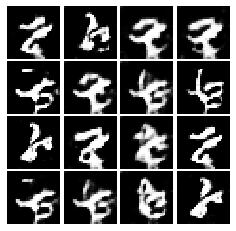

Epoch: 2, Iter: 1240, D: 0.3748, G:3.775
image shape: {} (16, 28, 28, 1)


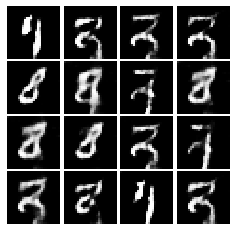

Epoch: 2, Iter: 1260, D: 0.3558, G:4.841
image shape: {} (16, 28, 28, 1)


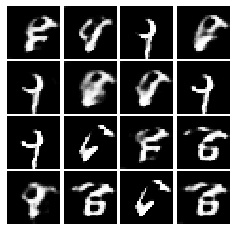

Epoch: 2, Iter: 1280, D: 0.6931, G:2.735
image shape: {} (16, 28, 28, 1)


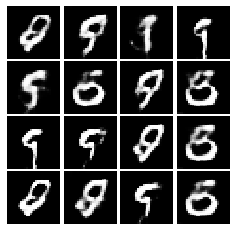

Epoch: 2, Iter: 1300, D: 0.3135, G:2.596
image shape: {} (16, 28, 28, 1)


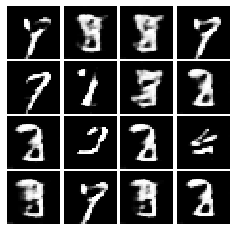

Epoch: 2, Iter: 1320, D: 0.9576, G:1.096
image shape: {} (16, 28, 28, 1)


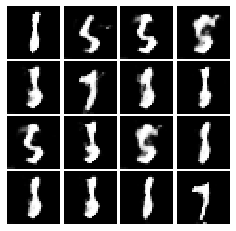

Epoch: 2, Iter: 1340, D: 0.4782, G:2.985
image shape: {} (16, 28, 28, 1)


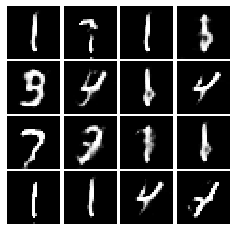

Epoch: 2, Iter: 1360, D: 0.7603, G:4.078
image shape: {} (16, 28, 28, 1)


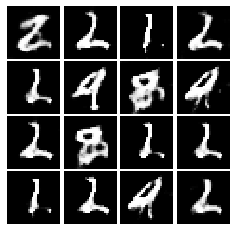

Epoch: 2, Iter: 1380, D: 0.2281, G:3.72
image shape: {} (16, 28, 28, 1)


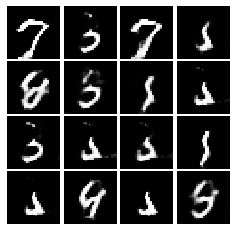

Epoch: 2, Iter: 1400, D: 0.3053, G:4.089
image shape: {} (16, 28, 28, 1)


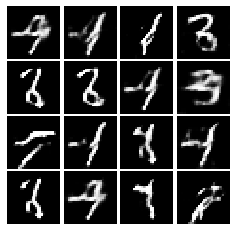

Epoch: 3, Iter: 1420, D: 0.2555, G:3.374
image shape: {} (16, 28, 28, 1)


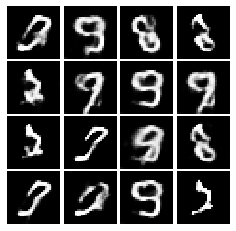

Epoch: 3, Iter: 1440, D: 0.5392, G:2.787
image shape: {} (16, 28, 28, 1)


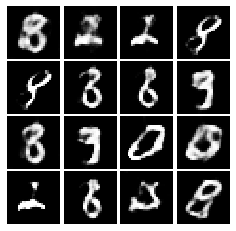

Epoch: 3, Iter: 1460, D: 0.6474, G:2.853
image shape: {} (16, 28, 28, 1)


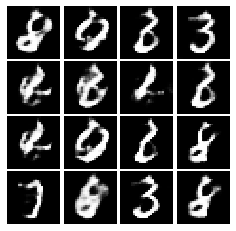

Epoch: 3, Iter: 1480, D: 0.3409, G:3.033
image shape: {} (16, 28, 28, 1)


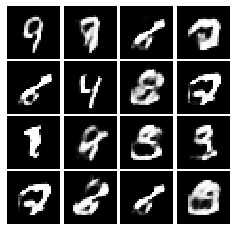

Epoch: 3, Iter: 1500, D: 0.6363, G:2.982
image shape: {} (16, 28, 28, 1)


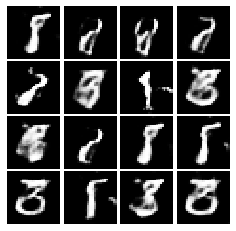

Epoch: 3, Iter: 1520, D: 0.6127, G:2.478
image shape: {} (16, 28, 28, 1)


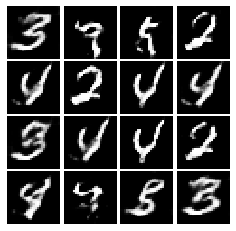

Epoch: 3, Iter: 1540, D: 0.4589, G:2.647
image shape: {} (16, 28, 28, 1)


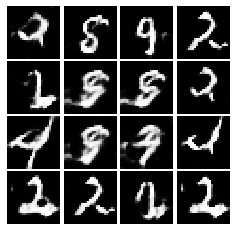

Epoch: 3, Iter: 1560, D: 0.5999, G:2.7
image shape: {} (16, 28, 28, 1)


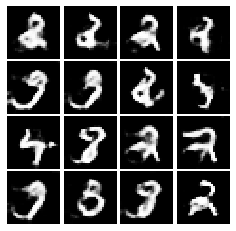

Epoch: 3, Iter: 1580, D: 0.4211, G:2.381
image shape: {} (16, 28, 28, 1)


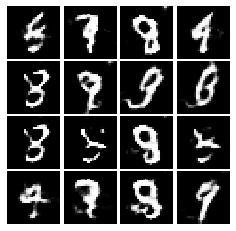

Epoch: 3, Iter: 1600, D: 0.4417, G:1.848
image shape: {} (16, 28, 28, 1)


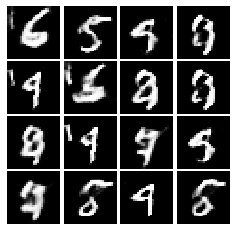

Epoch: 3, Iter: 1620, D: 0.4219, G:3.463
image shape: {} (16, 28, 28, 1)


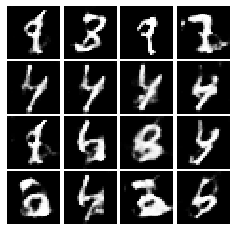

Epoch: 3, Iter: 1640, D: 0.3955, G:2.647
image shape: {} (16, 28, 28, 1)


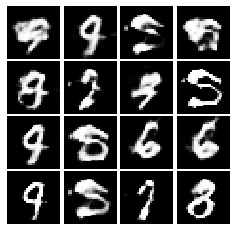

Epoch: 3, Iter: 1660, D: 0.8546, G:6.017
image shape: {} (16, 28, 28, 1)


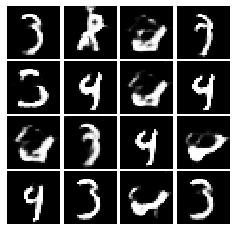

Epoch: 3, Iter: 1680, D: 0.4257, G:3.023
image shape: {} (16, 28, 28, 1)


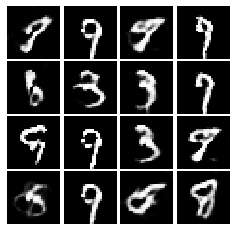

Epoch: 3, Iter: 1700, D: 0.3376, G:2.832
image shape: {} (16, 28, 28, 1)


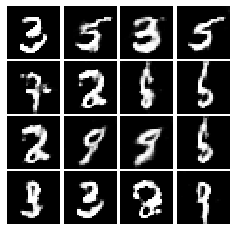

Epoch: 3, Iter: 1720, D: 0.568, G:3.273
image shape: {} (16, 28, 28, 1)


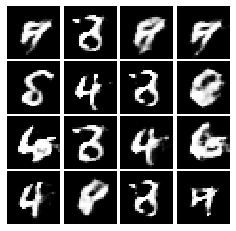

Epoch: 3, Iter: 1740, D: 0.4201, G:3.291
image shape: {} (16, 28, 28, 1)


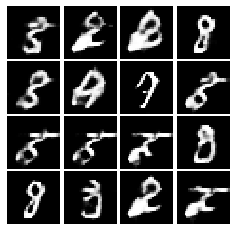

Epoch: 3, Iter: 1760, D: 0.307, G:2.626
image shape: {} (16, 28, 28, 1)


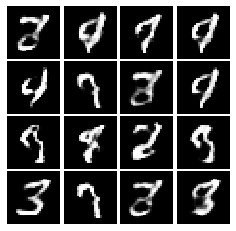

Epoch: 3, Iter: 1780, D: 0.5297, G:2.605
image shape: {} (16, 28, 28, 1)


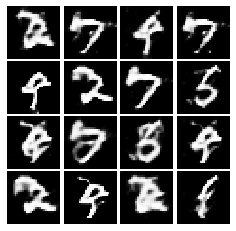

Epoch: 3, Iter: 1800, D: 0.6999, G:1.791
image shape: {} (16, 28, 28, 1)


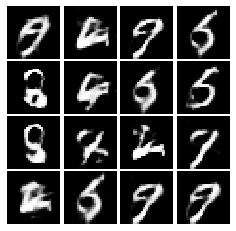

Epoch: 3, Iter: 1820, D: 0.5683, G:2.252
image shape: {} (16, 28, 28, 1)


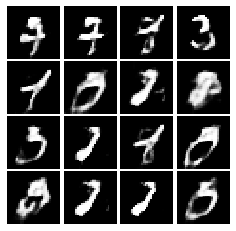

Epoch: 3, Iter: 1840, D: 0.5424, G:2.216
image shape: {} (16, 28, 28, 1)


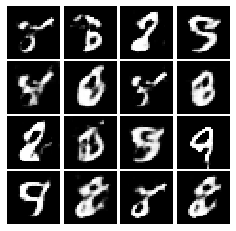

Epoch: 3, Iter: 1860, D: 0.3628, G:3.166
image shape: {} (16, 28, 28, 1)


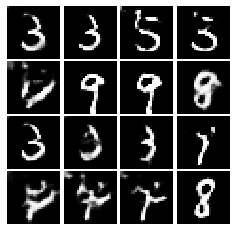

Epoch: 4, Iter: 1880, D: 0.3097, G:3.856
image shape: {} (16, 28, 28, 1)


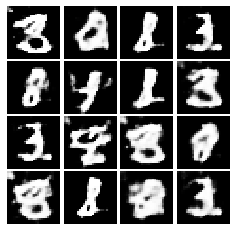

Epoch: 4, Iter: 1900, D: 0.4696, G:3.128
image shape: {} (16, 28, 28, 1)


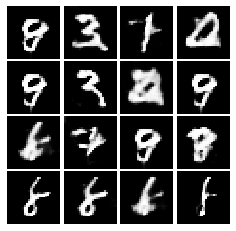

Epoch: 4, Iter: 1920, D: 0.3653, G:3.273
image shape: {} (16, 28, 28, 1)


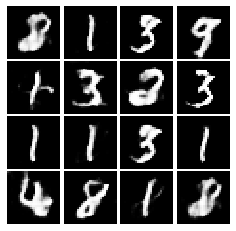

Epoch: 4, Iter: 1940, D: 0.5288, G:3.715
image shape: {} (16, 28, 28, 1)


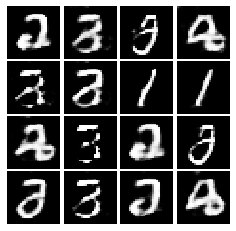

Epoch: 4, Iter: 1960, D: 0.5118, G:1.969
image shape: {} (16, 28, 28, 1)


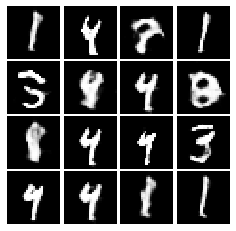

Epoch: 4, Iter: 1980, D: 0.3271, G:2.639
image shape: {} (16, 28, 28, 1)


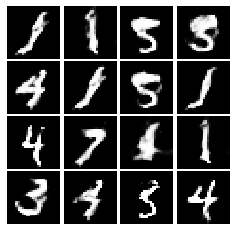

Epoch: 4, Iter: 2000, D: 1.05, G:3.521
image shape: {} (16, 28, 28, 1)


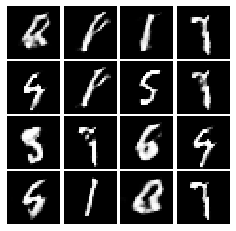

Epoch: 4, Iter: 2020, D: 0.6092, G:2.516
image shape: {} (16, 28, 28, 1)


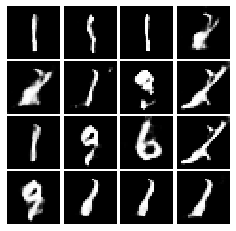

Epoch: 4, Iter: 2040, D: 0.4925, G:2.057
image shape: {} (16, 28, 28, 1)


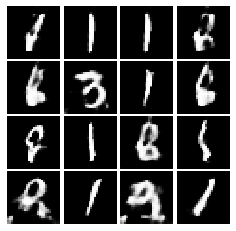

Epoch: 4, Iter: 2060, D: 0.356, G:2.869
image shape: {} (16, 28, 28, 1)


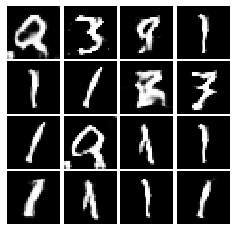

Epoch: 4, Iter: 2080, D: 0.5665, G:2.049
image shape: {} (16, 28, 28, 1)


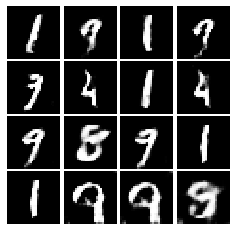

Epoch: 4, Iter: 2100, D: 0.4411, G:2.216
image shape: {} (16, 28, 28, 1)


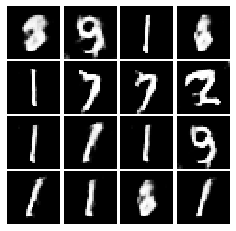

Epoch: 4, Iter: 2120, D: 0.524, G:1.766
image shape: {} (16, 28, 28, 1)


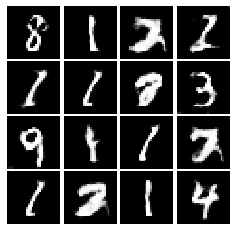

Epoch: 4, Iter: 2140, D: 0.6643, G:2.381
image shape: {} (16, 28, 28, 1)


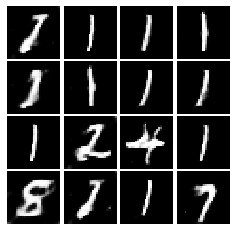

Epoch: 4, Iter: 2160, D: 0.7866, G:2.189
image shape: {} (16, 28, 28, 1)


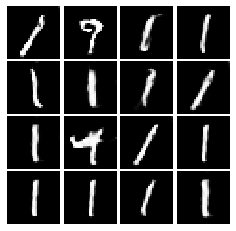

Epoch: 4, Iter: 2180, D: 0.4369, G:1.929
image shape: {} (16, 28, 28, 1)


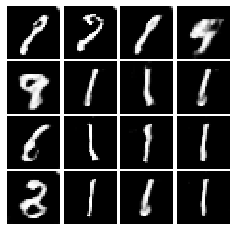

Epoch: 4, Iter: 2200, D: 0.5026, G:1.931
image shape: {} (16, 28, 28, 1)


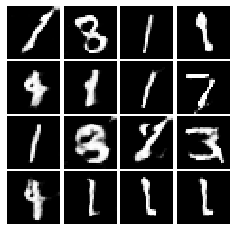

Epoch: 4, Iter: 2220, D: 0.3693, G:2.635
image shape: {} (16, 28, 28, 1)


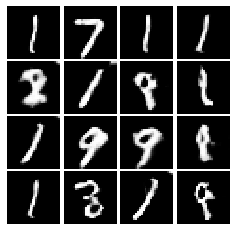

Epoch: 4, Iter: 2240, D: 0.4573, G:2.191
image shape: {} (16, 28, 28, 1)


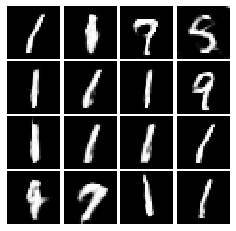

Epoch: 4, Iter: 2260, D: 0.4104, G:2.415
image shape: {} (16, 28, 28, 1)


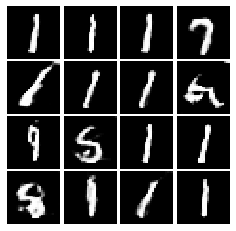

Epoch: 4, Iter: 2280, D: 0.4734, G:2.691
image shape: {} (16, 28, 28, 1)


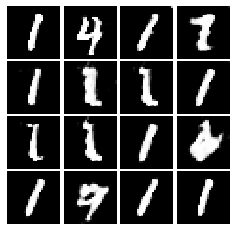

Epoch: 4, Iter: 2300, D: 0.5171, G:2.621
image shape: {} (16, 28, 28, 1)


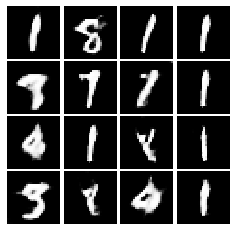

Epoch: 4, Iter: 2320, D: 0.6869, G:3.051
image shape: {} (16, 28, 28, 1)


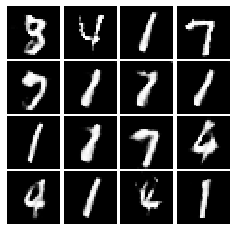

Epoch: 4, Iter: 2340, D: 0.5075, G:2.476
image shape: {} (16, 28, 28, 1)


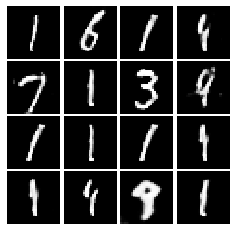

Final images
image shape: {} (16, 28, 28, 1)


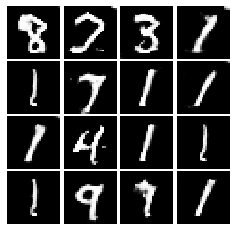

In [120]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
